<a href="https://colab.research.google.com/github/MiPf0/PredictingDisasterTweets/blob/main/TransformingDisasterTweets.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Setup

## Installationen und Importe von Bibliotheken

In [ ]:
# Info: mit Google Drive verbinden, da dort die Datensätze liegen
# Code-Quelle: Google

from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Info: Imports

# Code-Quelle: Curiousily, "Multi-label Text Classification with BERT and PyTorch Lightning", 2021
# Link: https://colab.research.google.com/drive/14Ea4lIzsn5EFvPpYKtWStXEByT9qmbkj?usp=sharing or https://curiousily.com/posts/multi-label-text-classification-with-bert-and-pytorch-lightning/
!pip install pytorch-lightning --quiet
import pytorch_lightning as pl

# Code-Quelle: Chris McCormick and Nick Ryan, "BERT Fine-Tuning Tutorial with PyTorch", 2019
# Link: https://colab.research.google.com/drive/1pTuQhug6Dhl9XalKB0zUGf4FIdYFlpcX or https://mccormickml.com/2019/07/22/BERT-fine-tuning/
import tensorflow as tf
!pip install transformers --quiet
import pandas as pd

# Code-Quelle: Zach (Statology), "How to Perform One-Hot Encoding in Python", 2021
# Link: https://www.statology.org/one-hot-encoding-in-python/
from sklearn.preprocessing import OneHotEncoder

# Code-Quelle: Curiousily, "Multi-label Text Classification with BERT and PyTorch Lightning", 2021
# Link: https://colab.research.google.com/drive/14Ea4lIzsn5EFvPpYKtWStXEByT9qmbkj?usp=sharing or https://curiousily.com/posts/multi-label-text-classification-with-bert-and-pytorch-lightning/
import numpy as np
from tqdm.auto import tqdm
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from transformers import BertTokenizerFast as BertTokenizer, BertModel, AdamW, get_linear_schedule_with_warmup

# from pytorch_lightning.metrics.functional import accuracy, f1, auroc -> funktioniert nicht mehr, da TorchMetrics eigenständig ist und kein Teil mehr von Pytorch Lightning
# Code-Quelle: https://torchmetrics.readthedocs.io/en/stable/pages/lightning.html
# daher alternativ:
from torchmetrics import Accuracy, F1Score, AUROC
from torchmetrics.classification import MulticlassAccuracy
from torchmetrics.classification import MulticlassAUROC

from pytorch_lightning.callbacks import ModelCheckpoint, EarlyStopping
from pytorch_lightning.loggers import TensorBoardLogger
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, multilabel_confusion_matrix

# sklearn website - classweights method:
from sklearn.utils import class_weight

import seaborn as sns
from pylab import rcParams
import matplotlib.pyplot as plt
from matplotlib import rc
%matplotlib inline
%config InlineBackend.figure_format='retina'
RANDOM_SEED = 42
sns.set(style='whitegrid', palette='muted', font_scale=1.2)
HAPPY_COLORS_PALETTE = ["#01BEFE", "#FFDD00", "#FF7D00", "#FF006D", "#ADFF02", "#8F00FF"]
sns.set_palette(sns.color_palette(HAPPY_COLORS_PALETTE))
rcParams['figure.figsize'] = 12, 8
pl.seed_everything(RANDOM_SEED)

from imblearn.over_sampling import RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler

import time

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 718.6/718.6 kB 39.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 519.2/519.2 kB 47.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 63.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 264.6/264.6 kB 6.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 158.8/158.8 kB 20.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 114.2/114.2 kB 15.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.0/7.0 MB 75.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 106.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 200.1/200.1 kB 24.8 MB/s eta 0:00:00


INFO:lightning_fabric.utilities.seed:Global seed set to 42


In [ ]:
# Info: aktuellen Zeitstempel definieren
ts = time.time()

In [ ]:
# Info: Test, ob GPU gefunden wurde
# Code-Quelle: Chris McCormick and Nick Ryan, "BERT Fine-Tuning Tutorial with PyTorch", 2019
# Link: https://colab.research.google.com/drive/1pTuQhug6Dhl9XalKB0zUGf4FIdYFlpcX or https://mccormickml.com/2019/07/22/BERT-fine-tuning/

# Abrufen des GPU-Gerätenamens.
device_name = tf.test.gpu_device_name()

# Der Gerätename sollte folgendermaßen aussehen:
if device_name == '/device:GPU:0':
    print('GPU gefunden unter: {}'.format(device_name))
else:
    raise SystemError('GPU-Gerät nicht gefunden')

# Wenn eine GPU verfügbar ist...
if torch.cuda.is_available():    

    # PyTorch informieren, dass es die GPU benutzen soll.    
    device = torch.device("cuda")

    print('Es sind %d GPU(s) verfügbar.' % torch.cuda.device_count())

    print('Wir werden diese GPU verwenden:', torch.cuda.get_device_name(0))

# Falls nicht...
else:
    print('No GPU available, using the CPU instead.')
    device = torch.device("cpu")

GPU gefunden unter: /device:GPU:0
Es sind 1 GPU(s) verfügbar.
Wir werden diese GPU verwenden: NVIDIA A100-SXM4-40GB


## Trainings-, Validierungs- und Test-Datensätze importieren

In [ ]:
# Info: Datensätze in Pandas Datenrahmen laden, Anzahl an Datenpunkten wiedergeben (gleiche Code-Quelle wie in vorheriger Code-Zelle, kleine Anpassungen)

data_path_train_df = "/content/drive/MyDrive/TransformingDisasterTweets/Data/train_merged.tsv"
data_path_val_df = "/content/drive/MyDrive/TransformingDisasterTweets/Data/dev_merged.tsv"
data_path_test_df = "/content/drive/MyDrive/TransformingDisasterTweets/Data/test_merged.tsv"

# Trainings-Datenrahmen kreieren
train_df = pd.read_csv(data_path_train_df, delimiter='\t')
print('Tweet-Anzahl train_df: {:,}'.format(train_df.shape[0]))
print('Spalten-Anzahl train_df: {:,}\n'.format(train_df.shape[1]))

# Validierungs-Datenrahmen kreieren
val_df = pd.read_csv(data_path_val_df, delimiter='\t')
print('Tweet-Anzahl val_df: {:,}'.format(val_df.shape[0]))
print('Spalten-Anzahl val_df: {:,}\n'.format(val_df.shape[1]))

# Test-Datenrahmen kreieren
test_df = pd.read_csv(data_path_test_df, delimiter='\t')
print('Tweet-Anzahl test_df: {:,}'.format(test_df.shape[0]))
print('Spalten-Anzahl test_df: {:,}'.format(test_df.shape[1]))

Tweet-Anzahl train_df: 53,531
Spalten-Anzahl train_df: 5

Tweet-Anzahl val_df: 7,793
Spalten-Anzahl val_df: 5

Tweet-Anzahl test_df: 15,160
Spalten-Anzahl test_df: 5


# Initiale Daten-Vorverarbeitung

## Datensatz-Erstellung und -Begutachtung

### Auflistung aller Katastrophenarten und humanitären Kategorien

In [ ]:
# Info: Alle verfügbaren Katastrophen-Ereignisarten auflisten
# Code-Quelle: dblilienthal, "Multiclass-Text-Classification-with-DistilBERT-on-COVID-19-Tweets", 2021; etwas angepasst
# Link: https://github.com/dblilienthal/Multiclass-Text-Classification-with-DistilBERT-on-COVID-19-Tweets/blob/main/Multiclass%20Text%20Classification%20with%20DistilBERT%20on%20COVID-19%20Tweets.ipynb

label_in_question = 'event_type_label'

label_dict = (train_df[[label_in_question]].drop_duplicates()
              .sort_values(by=label_in_question)
              .reset_index(drop=True)[label_in_question]
              .to_dict())

print('Folgende Kategorien an Katastrophenarten existieren in den Datensätzen:')

for index, key in label_dict.items():
    print(index, key)

Folgende Kategorien an Katastrophenarten existieren in den Datensätzen:
0 earthquake
1 floods
2 hurricane
3 wildfires


In [ ]:
# Info: Alle verfügbaren humanitären Klassen auflisten (gleiche Code-Quelle wie in vorheriger Code-Zelle, etwas angepasst)

label_in_question = 'class_label'

label_dict = (train_df[[label_in_question]].drop_duplicates()
              .sort_values(by=label_in_question)
              .reset_index(drop=True)[label_in_question]
              .to_dict())

print('Folgende humanitäre Kategorien existieren in den Datensätzen:')

for index, key in label_dict.items():
    print(index, key)

Folgende humanitäre Kategorien existieren in den Datensätzen:
0 caution_and_advice
1 displaced_people_and_evacuations
2 infrastructure_and_utility_damage
3 injured_or_dead_people
4 missing_or_found_people
5 not_humanitarian
6 other_relevant_information
7 requests_or_urgent_needs
8 rescue_volunteering_or_donation_effort
9 sympathy_and_support


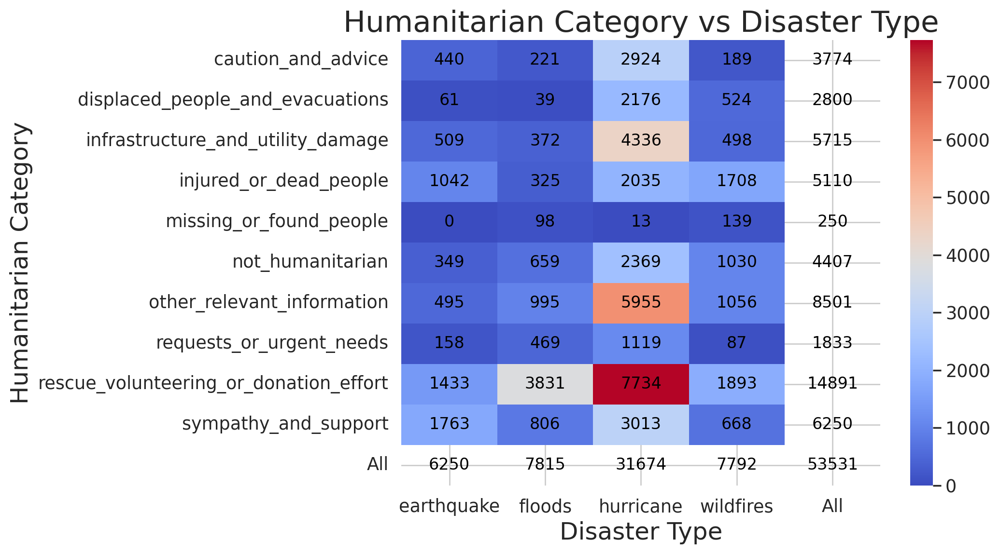

In [ ]:
# create pivot table
pivot_table = pd.pivot_table(train_df, values='tweet_text', index=['class_label'], columns=['event_type_label'], aggfunc='count', fill_value=0, margins=True) #margins=True erzeugt 'All' column und row

# create heatmap plot
fig, ax = plt.subplots(figsize=(8, 6))

mask = np.zeros((11, 5))
mask[:,4] = True
mask[10,:] = True
#sns.heatmap(pivot_table, mask=mask, annot=True, cmap='YlGnBu', fmt='g')
sns.heatmap(pivot_table, mask=mask, cmap=sns.color_palette("coolwarm", as_cmap=True))
sns.heatmap(pivot_table, alpha=0, cbar=False, annot=True, annot_kws={"size": 12, "color":"black"}, fmt='g')

#sns.heatmap(pivot_table, annot=True, cmap='YlGnBu', fmt='g')

# set plot title and axis labels
plt.title('Humanitarian Category vs Disaster Type', fontsize=22)
plt.xlabel('Disaster Type', fontsize=18)
plt.ylabel('Humanitarian Category', fontsize=18)

plt.show()

### Erstellung der 18 Teil-Datenrahmen und Begutachtung

In [ ]:
# Info: Teil-Datenrahmen erstellen und unbrauchbare Spalten entfernen
# Code-Quelle: theartificialguy, "Multi Label Text Classification using BERT PyTorch", 2021
# Link: https://github.com/theartificialguy/NLP-with-Deep-Learning/blob/master/BERT/Multi%20Label%20Text%20Classification%20using%20BERT%20PyTorch/bert_multilabel_pytorch_standard.ipynb

def create_disaster_dataframe_with_reindex(df_to_copy, labels_to_drop, labels_to_reindex, filter=False, filter_label=None):
  df_to_work_with = df_to_copy.copy()
  if (filter):
    df_to_work_with = df_to_work_with[df_to_work_with['event_type_label'] == filter_label].reset_index(drop=True)
  df_to_work_with.drop(labels=labels_to_drop, axis=1, inplace=True)
  return df_to_work_with.reindex(columns=labels_to_reindex)

drop_labels_lv1 = ['event_name_label', 'tweet_id', 'class_label']
reindex_labels_lv1 = ['tweet_text', 'event_type_label']

drop_labels_lv2 = ['event_name_label', 'event_type_label', 'tweet_id']
reindex_labels_lv2 = ['tweet_text', 'class_label']

label_equ = 'earthquake'
label_fld = 'floods'
label_hrc = 'hurricane'
label_wfr = 'wildfires'

# Level 1
train_df_lv1 = create_disaster_dataframe_with_reindex(train_df,drop_labels_lv1,reindex_labels_lv1)
val_df_lv1 = create_disaster_dataframe_with_reindex(val_df,drop_labels_lv1,reindex_labels_lv1)
test_df_lv1 = create_disaster_dataframe_with_reindex(test_df,drop_labels_lv1,reindex_labels_lv1)

# Level 2
train_df_lv2 = create_disaster_dataframe_with_reindex(train_df,drop_labels_lv2,reindex_labels_lv2)
val_df_lv2 = create_disaster_dataframe_with_reindex(val_df,drop_labels_lv2,reindex_labels_lv2)
test_df_lv2 = create_disaster_dataframe_with_reindex(test_df,drop_labels_lv2,reindex_labels_lv2)

# Earthquake
train_df_lv2_equ = create_disaster_dataframe_with_reindex(train_df,drop_labels_lv2,reindex_labels_lv2,filter=True,filter_label=label_equ)
val_df_lv2_equ = create_disaster_dataframe_with_reindex(val_df,drop_labels_lv2,reindex_labels_lv2,filter=True,filter_label=label_equ)
test_df_lv2_equ = create_disaster_dataframe_with_reindex(test_df,drop_labels_lv2,reindex_labels_lv2,filter=True,filter_label=label_equ)

# Floods
train_df_lv2_fld = create_disaster_dataframe_with_reindex(train_df,drop_labels_lv2,reindex_labels_lv2,filter=True,filter_label=label_fld)
val_df_lv2_fld = create_disaster_dataframe_with_reindex(val_df,drop_labels_lv2,reindex_labels_lv2,filter=True,filter_label=label_fld)
test_df_lv2_fld = create_disaster_dataframe_with_reindex(test_df,drop_labels_lv2,reindex_labels_lv2,filter=True,filter_label=label_fld)

# Hurricane
train_df_lv2_hrc = create_disaster_dataframe_with_reindex(train_df,drop_labels_lv2,reindex_labels_lv2,filter=True,filter_label=label_hrc)
val_df_lv2_hrc = create_disaster_dataframe_with_reindex(val_df,drop_labels_lv2,reindex_labels_lv2,filter=True,filter_label=label_hrc)
test_df_lv2_hrc = create_disaster_dataframe_with_reindex(test_df,drop_labels_lv2,reindex_labels_lv2,filter=True,filter_label=label_hrc)

# Wildfires
train_df_lv2_wfr = create_disaster_dataframe_with_reindex(train_df,drop_labels_lv2,reindex_labels_lv2,filter=True,filter_label=label_wfr)
val_df_lv2_wfr = create_disaster_dataframe_with_reindex(val_df,drop_labels_lv2,reindex_labels_lv2,filter=True,filter_label=label_wfr)
test_df_lv2_wfr = create_disaster_dataframe_with_reindex(test_df,drop_labels_lv2,reindex_labels_lv2,filter=True,filter_label=label_wfr)

In [ ]:
# Info: Beschriftungs-Verteilung der Katastrophenarten begutachten
# Code-Quelle: Curiousily, "Multi-label Text Classification with BERT and PyTorch Lightning", 2021
# Link: https://colab.research.google.com/drive/14Ea4lIzsn5EFvPpYKtWStXEByT9qmbkj?usp=sharing or https://curiousily.com/posts/multi-label-text-classification-with-bert-and-pytorch-lightning/

def print_class_counts(df,label,heading,heading_part):
  cc = df[label].value_counts()
  pc = df[label].value_counts(normalize=True).mul(100).round(1).astype(str) + '%'
  print(heading + heading_part + ':')
  print(pd.concat([cc,pc], axis=1, keys=['Anzahl','Prozent']))
  print('Gesamt: ' + str(len(df.index)))
  print('\n')

label_in_question_lv1 = 'event_type_label'
label_in_question_lv2 = 'class_label'
disaster_type_heading = 'Verteilung der Katastrophenarten über alle Tweets '
humanitarian_cat_heading = 'Verteilung der humanitären Kategorien über alle Tweets '
humanitarian_cat_heading_equ = 'Verteilung der humanitären Kategorien über alle Tweets des Typs "Earthquake" '
humanitarian_cat_heading_fld = 'Verteilung der humanitären Kategorien über alle Tweets des Typs "Floods" '
humanitarian_cat_heading_hrc = 'Verteilung der humanitären Kategorien über alle Tweets des Typs "Hurricane" '
humanitarian_cat_heading_wfr = 'Verteilung der humanitären Kategorien über alle Tweets des Typs "Wildfires" '
train_heading = '- Trainingsdaten'
test_heading = '- Validierungsdaten'
val_heading = '- Testdaten'

print_class_counts(train_df_lv1,label_in_question_lv1,disaster_type_heading,train_heading)
print_class_counts(val_df_lv1,label_in_question_lv1,disaster_type_heading,val_heading)
print_class_counts(test_df_lv1,label_in_question_lv1,disaster_type_heading,test_heading)

Verteilung der Katastrophenarten über alle Tweets - Trainingsdaten:
            Anzahl Prozent
hurricane    31674   59.2%
floods        7815   14.6%
wildfires     7792   14.6%
earthquake    6250   11.7%
Gesamt: 53531


Verteilung der Katastrophenarten über alle Tweets - Testdaten:
            Anzahl Prozent
hurricane     4613   59.2%
floods        1137   14.6%
wildfires     1134   14.6%
earthquake     909   11.7%
Gesamt: 7793


Verteilung der Katastrophenarten über alle Tweets - Validierungsdaten:
            Anzahl Prozent
hurricane     8966   59.1%
floods        2214   14.6%
wildfires     2207   14.6%
earthquake    1773   11.7%
Gesamt: 15160




In [ ]:
print_class_counts(train_df_lv2,label_in_question_lv2,humanitarian_cat_heading,train_heading)
print_class_counts(val_df_lv2,label_in_question_lv2,humanitarian_cat_heading,val_heading)
print_class_counts(test_df_lv2,label_in_question_lv2,humanitarian_cat_heading,test_heading)

Verteilung der humanitären Kategorien über alle Tweets - Trainingsdaten:
                                        Anzahl Prozent
rescue_volunteering_or_donation_effort   14891   27.8%
other_relevant_information                8501   15.9%
sympathy_and_support                      6250   11.7%
infrastructure_and_utility_damage         5715   10.7%
injured_or_dead_people                    5110    9.5%
not_humanitarian                          4407    8.2%
caution_and_advice                        3774    7.1%
displaced_people_and_evacuations          2800    5.2%
requests_or_urgent_needs                  1833    3.4%
missing_or_found_people                    250    0.5%
Gesamt: 53531


Verteilung der humanitären Kategorien über alle Tweets - Testdaten:
                                        Anzahl Prozent
rescue_volunteering_or_donation_effort    2168   27.8%
other_relevant_information                1236   15.9%
sympathy_and_support                       909   11.7%
infrastructure_and

In [ ]:
print_class_counts(train_df_lv2_equ,label_in_question_lv2,humanitarian_cat_heading_equ,train_heading)
print_class_counts(val_df_lv2_equ,label_in_question_lv2,humanitarian_cat_heading_equ,val_heading)
print_class_counts(test_df_lv2_equ,label_in_question_lv2,humanitarian_cat_heading_equ,test_heading)

Verteilung der humanitären Kategorien über alle Tweets des Typs "Earthquake" - Trainingsdaten:
                                        Anzahl Prozent
sympathy_and_support                      1763   28.2%
rescue_volunteering_or_donation_effort    1433   22.9%
injured_or_dead_people                    1042   16.7%
infrastructure_and_utility_damage          509    8.1%
other_relevant_information                 495    7.9%
caution_and_advice                         440    7.0%
not_humanitarian                           349    5.6%
requests_or_urgent_needs                   158    2.5%
displaced_people_and_evacuations            61    1.0%
Gesamt: 6250


Verteilung der humanitären Kategorien über alle Tweets des Typs "Earthquake" - Testdaten:
                                        Anzahl Prozent
sympathy_and_support                       257   28.3%
rescue_volunteering_or_donation_effort     208   22.9%
injured_or_dead_people                     153   16.8%
infrastructure_and_utility_dam

In [ ]:
print_class_counts(train_df_lv2_fld,label_in_question_lv2,humanitarian_cat_heading_fld,train_heading)
print_class_counts(val_df_lv2_fld,label_in_question_lv2,humanitarian_cat_heading_fld,val_heading)
print_class_counts(test_df_lv2_fld,label_in_question_lv2,humanitarian_cat_heading_fld,test_heading)

Verteilung der humanitären Kategorien über alle Tweets des Typs "Floods" - Trainingsdaten:
                                        Anzahl Prozent
rescue_volunteering_or_donation_effort    3831   49.0%
other_relevant_information                 995   12.7%
sympathy_and_support                       806   10.3%
not_humanitarian                           659    8.4%
requests_or_urgent_needs                   469    6.0%
infrastructure_and_utility_damage          372    4.8%
injured_or_dead_people                     325    4.2%
caution_and_advice                         221    2.8%
missing_or_found_people                     98    1.3%
displaced_people_and_evacuations            39    0.5%
Gesamt: 7815


Verteilung der humanitären Kategorien über alle Tweets des Typs "Floods" - Testdaten:
                                        Anzahl Prozent
rescue_volunteering_or_donation_effort     557   49.0%
other_relevant_information                 145   12.8%
sympathy_and_support                  

In [ ]:
print_class_counts(train_df_lv2_hrc,label_in_question_lv2,humanitarian_cat_heading_hrc,train_heading)
print_class_counts(val_df_lv2_hrc,label_in_question_lv2,humanitarian_cat_heading_hrc,val_heading)
print_class_counts(test_df_lv2_hrc,label_in_question_lv2,humanitarian_cat_heading_hrc,test_heading)

Verteilung der humanitären Kategorien über alle Tweets des Typs "Hurricane" - Trainingsdaten:
                                        Anzahl Prozent
rescue_volunteering_or_donation_effort    7734   24.4%
other_relevant_information                5955   18.8%
infrastructure_and_utility_damage         4336   13.7%
sympathy_and_support                      3013    9.5%
caution_and_advice                        2924    9.2%
not_humanitarian                          2369    7.5%
displaced_people_and_evacuations          2176    6.9%
injured_or_dead_people                    2035    6.4%
requests_or_urgent_needs                  1119    3.5%
missing_or_found_people                     13    0.0%
Gesamt: 31674


Verteilung der humanitären Kategorien über alle Tweets des Typs "Hurricane" - Testdaten:
                                        Anzahl Prozent
rescue_volunteering_or_donation_effort    1128   24.5%
other_relevant_information                 866   18.8%
infrastructure_and_utility_dama

In [ ]:
print_class_counts(train_df_lv2_wfr,label_in_question_lv2,humanitarian_cat_heading_wfr,train_heading)
print_class_counts(val_df_lv2_wfr,label_in_question_lv2,humanitarian_cat_heading_wfr,val_heading)
print_class_counts(test_df_lv2_wfr,label_in_question_lv2,humanitarian_cat_heading_wfr,test_heading)

Verteilung der humanitären Kategorien über alle Tweets des Typs "Wildfires" - Trainingsdaten:
                                        Anzahl Prozent
rescue_volunteering_or_donation_effort    1893   24.3%
injured_or_dead_people                    1708   21.9%
other_relevant_information                1056   13.6%
not_humanitarian                          1030   13.2%
sympathy_and_support                       668    8.6%
displaced_people_and_evacuations           524    6.7%
infrastructure_and_utility_damage          498    6.4%
caution_and_advice                         189    2.4%
missing_or_found_people                    139    1.8%
requests_or_urgent_needs                    87    1.1%
Gesamt: 7792


Verteilung der humanitären Kategorien über alle Tweets des Typs "Wildfires" - Testdaten:
                                        Anzahl Prozent
rescue_volunteering_or_donation_effort     275   24.3%
injured_or_dead_people                     249   22.0%
other_relevant_information      

## Option: Ausgleich der unausgewogenen Trainings-Datensätze

In [ ]:
# Info: Funktion zum Ausgleich der Datenpunkte definieren und an allen Trainings-Datenrahmen anwenden
# Code-Quelle: Imbalanced Learn, "imbalanced-learn documentation", 2022
# Link: https://imbalanced-learn.org/stable/references/generated/imblearn.over_sampling.RandomOverSampler.html

def balancingData(dataset, secondLabel, size):
  # X_train und y_train definieren
  X_train = dataset['tweet_text']
  y_train = dataset[secondLabel]
  # Bestimmen, welche Klassen oversampled und welche undersampled werden sollen
  class_counts = y_train.value_counts()
  classes_to_oversample = [class_label for class_label in y_train.unique() if class_counts[class_label] < int(size)]
  classes_to_undersample = [class_label for class_label in y_train.unique() if class_counts[class_label] > int(size)]
  # Minoritätsklassen oversamplen
  oversampler = RandomOverSampler(sampling_strategy={class_label: int(size) for class_label in classes_to_oversample})
  X_train_resampled, y_train_resampled = oversampler.fit_resample(X_train.to_frame(), y_train)
  # Majoritätsklassen undersamplen
  undersampler = RandomUnderSampler(sampling_strategy={class_label: int(size) for class_label in classes_to_undersample})
  X_train_resampled, y_train_resampled = undersampler.fit_resample(X_train_resampled, y_train_resampled)
  # Daten zusammenfügen
  return pd.concat([X_train_resampled, y_train_resampled], axis=1)

train_df_lv1_resampled = balancingData(train_df_lv1, 'event_type_label', 7815)
train_df_lv2_resampled = balancingData(train_df_lv2, 'class_label', int(train_df_lv2['class_label'].value_counts().mean()))
train_df_lv2_equ_resampled = balancingData(train_df_lv2_equ, 'class_label', int(train_df_lv2_equ['class_label'].value_counts().mean()))
train_df_lv2_fld_resampled = balancingData(train_df_lv2_fld, 'class_label', int(train_df_lv2_fld['class_label'].value_counts().mean()))
train_df_lv2_hrc_resampled = balancingData(train_df_lv2_hrc, 'class_label', int(train_df_lv2_hrc['class_label'].value_counts().mean()))
train_df_lv2_wfr_resampled = balancingData(train_df_lv2_wfr, 'class_label', int(train_df_lv2_wfr['class_label'].value_counts().mean()))

In [ ]:
train_df_lv1_resampled['event_type_label'].value_counts()

earthquake    7815
floods        7815
hurricane     7815
wildfires     7815
Name: event_type_label, dtype: int64

In [ ]:
train_df_lv2_resampled['class_label'].value_counts()

caution_and_advice                        5353
displaced_people_and_evacuations          5353
infrastructure_and_utility_damage         5353
injured_or_dead_people                    5353
missing_or_found_people                   5353
not_humanitarian                          5353
other_relevant_information                5353
requests_or_urgent_needs                  5353
rescue_volunteering_or_donation_effort    5353
sympathy_and_support                      5353
Name: class_label, dtype: int64

In [ ]:
train_df_lv2_equ_resampled['class_label'].value_counts()

caution_and_advice                        694
displaced_people_and_evacuations          694
infrastructure_and_utility_damage         694
injured_or_dead_people                    694
not_humanitarian                          694
other_relevant_information                694
requests_or_urgent_needs                  694
rescue_volunteering_or_donation_effort    694
sympathy_and_support                      694
Name: class_label, dtype: int64

In [ ]:
train_df_lv2_fld_resampled['class_label'].value_counts()

caution_and_advice                        781
displaced_people_and_evacuations          781
infrastructure_and_utility_damage         781
injured_or_dead_people                    781
missing_or_found_people                   781
not_humanitarian                          781
other_relevant_information                781
requests_or_urgent_needs                  781
rescue_volunteering_or_donation_effort    781
sympathy_and_support                      781
Name: class_label, dtype: int64

In [ ]:
train_df_lv2_hrc_resampled['class_label'].value_counts()

caution_and_advice                        3167
displaced_people_and_evacuations          3167
infrastructure_and_utility_damage         3167
injured_or_dead_people                    3167
missing_or_found_people                   3167
not_humanitarian                          3167
other_relevant_information                3167
requests_or_urgent_needs                  3167
rescue_volunteering_or_donation_effort    3167
sympathy_and_support                      3167
Name: class_label, dtype: int64

In [ ]:
train_df_lv2_wfr_resampled['class_label'].value_counts()

caution_and_advice                        779
displaced_people_and_evacuations          779
infrastructure_and_utility_damage         779
injured_or_dead_people                    779
missing_or_found_people                   779
not_humanitarian                          779
other_relevant_information                779
requests_or_urgent_needs                  779
rescue_volunteering_or_donation_effort    779
sympathy_and_support                      779
Name: class_label, dtype: int64

## Option: One-Hot Encoding aller Datensätze (nicht-ausgeglichene und ausgeglichene Datensätze)

In [ ]:
# Info: alle Datenrahmen one-hot-encoden
# Code-Quelle: Scikit Learn, "scikit-learn", 2023
# Link: https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.OneHotEncoder.html

def onehotencode(encoder, labels, dataset, label_to_array_and_drop):
  encoder_dataset = pd.DataFrame(encoder.fit_transform(dataset[[label_to_array_and_drop]]).toarray())
  dataset = dataset.join(encoder_dataset)
  dataset.drop(label_to_array_and_drop, axis=1, inplace=True)
  dataset.columns = labels
  return dataset

encoder = OneHotEncoder(handle_unknown='ignore')

COLUMNS_LV1 = ['tweet_text', 'earthquake',  'floods',  'hurricane', 'wildfires']

COLUMNS_LV2 = ['tweet_text',
          'caution_and_advice', 
          'displaced_people_and_evacuations', 
          'infrastructure_and_utility_damage', 
          'injured_or_dead_people', 
          'missing_or_found_people', 
          'not_humanitarian', 
          'other_relevant_information', 
          'requests_or_urgent_needs', 
          'rescue_volunteering_or_donation_effort', 
          'sympathy_and_support']

COLUMNS_LV2_EQU = ['tweet_text',
          'caution_and_advice', 
          'displaced_people_and_evacuations', 
          'infrastructure_and_utility_damage', 
          'injured_or_dead_people',  
          'not_humanitarian', 
          'other_relevant_information', 
          'requests_or_urgent_needs', 
          'rescue_volunteering_or_donation_effort', 
          'sympathy_and_support']

#Level1
train_df_lv1_ohencoded = onehotencode(encoder, COLUMNS_LV1, train_df_lv1, 'event_type_label')
train_df_lv1_resampled_ohencoded = onehotencode(encoder, COLUMNS_LV1, train_df_lv1_resampled, 'event_type_label')
val_df_lv1_ohencoded = onehotencode(encoder, COLUMNS_LV1, val_df_lv1, 'event_type_label')
test_df_lv1_ohencoded = onehotencode(encoder, COLUMNS_LV1, test_df_lv1, 'event_type_label')

#Level2
train_df_lv2_ohencoded = onehotencode(encoder, COLUMNS_LV2, train_df_lv2, 'class_label')
train_df_lv2_resampled_ohencoded = onehotencode(encoder, COLUMNS_LV2, train_df_lv2_resampled, 'class_label')
val_df_lv2_ohencoded = onehotencode(encoder, COLUMNS_LV2, val_df_lv2, 'class_label')
test_df_lv2_ohencoded = onehotencode(encoder, COLUMNS_LV2, test_df_lv2, 'class_label')

#Earthquake
train_df_lv2_equ_ohencoded = onehotencode(encoder, COLUMNS_LV2_EQU, train_df_lv2_equ, 'class_label')
train_df_lv2_equ_resampled_ohencoded = onehotencode(encoder, COLUMNS_LV2_EQU, train_df_lv2_equ_resampled, 'class_label')
val_df_lv2_equ_ohencoded = onehotencode(encoder, COLUMNS_LV2_EQU, val_df_lv2_equ, 'class_label')
test_df_lv2_equ_ohencoded = onehotencode(encoder, COLUMNS_LV2_EQU, test_df_lv2_equ, 'class_label')

#Hurricane
train_df_lv2_hrc_ohencoded = onehotencode(encoder, COLUMNS_LV2, train_df_lv2_hrc, 'class_label')
train_df_lv2_hrc_resampled_ohencoded = onehotencode(encoder, COLUMNS_LV2, train_df_lv2_hrc_resampled, 'class_label')
val_df_lv2_hrc_ohencoded = onehotencode(encoder, COLUMNS_LV2, val_df_lv2_hrc, 'class_label')
test_df_lv2_hrc_ohencoded = onehotencode(encoder, COLUMNS_LV2, test_df_lv2_hrc, 'class_label')

#Floods
train_df_lv2_fld_ohencoded = onehotencode(encoder, COLUMNS_LV2, train_df_lv2_fld, 'class_label')
train_df_lv2_fld_resampled_ohencoded = onehotencode(encoder, COLUMNS_LV2, train_df_lv2_fld_resampled, 'class_label')
val_df_lv2_fld_ohencoded = onehotencode(encoder, COLUMNS_LV2, val_df_lv2_fld, 'class_label')
test_df_lv2_fld_ohencoded = onehotencode(encoder, COLUMNS_LV2, test_df_lv2_fld, 'class_label')

#Wildfires
train_df_lv2_wfr_ohencoded = onehotencode(encoder, COLUMNS_LV2, train_df_lv2_wfr, 'class_label')
train_df_lv2_wfr_resampled_ohencoded = onehotencode(encoder, COLUMNS_LV2, train_df_lv2_wfr_resampled, 'class_label')
val_df_lv2_wfr_ohencoded = onehotencode(encoder, COLUMNS_LV2, val_df_lv2_wfr, 'class_label')
test_df_lv2_wfr_ohencoded = onehotencode(encoder, COLUMNS_LV2, test_df_lv2_wfr, 'class_label')

## Option: Ordinale Beschriftungen anstatt OHE

In [ ]:
# Ordinale Beschriftungen - nicht gemacht - stattdessen OneHotEncoding

# Info: Labels kodieren ohne One-Hot-Encoding
# Code-Quelle: Towardsdatascience - Susan Li, "Multi Class Text Classification With Deep Learning Using BERT", 2020
# Link: https://towardsdatascience.com/multi-class-text-classification-with-deep-learning-using-bert-b59ca2f5c613

def create_disaster_dataframe_with_ordinal_labels(df_to_copy, label):
  possible_labels = sorted(df_to_copy[label].unique())
  label_dict = {}
  for index, possible_label in enumerate(possible_labels):
    label_dict[possible_label] = index
  new_df = df_to_copy.copy()
  new_df[label] = new_df[label].replace(label_dict)
  return new_df

train_df_lv1_ordinal_labels = create_disaster_dataframe_with_ordinal_labels(train_df_lv1, 'event_type_label')
val_df_lv1_ordinal_labels = create_disaster_dataframe_with_ordinal_labels(val_df_lv1, 'event_type_label')
test_df_lv1_ordinal_labels = create_disaster_dataframe_with_ordinal_labels(test_df_lv1, 'event_type_label')

train_df_lv2_ordinal_labels = create_disaster_dataframe_with_ordinal_labels(train_df_lv2, 'class_label')
val_df_lv2_ordinal_labels = create_disaster_dataframe_with_ordinal_labels(val_df_lv2, 'class_label')
test_df_lv2_ordinal_labels = create_disaster_dataframe_with_ordinal_labels(test_df_lv2, 'class_label')

train_df_lv2_equ_ordinal_labels = create_disaster_dataframe_with_ordinal_labels(train_df_lv2_equ, 'class_label')
val_df_lv2_equ_ordinal_labels = create_disaster_dataframe_with_ordinal_labels(val_df_lv2_equ, 'class_label')
test_df_lv2_equ_ordinal_labels = create_disaster_dataframe_with_ordinal_labels(test_df_lv2_equ, 'class_label')

train_df_lv2_fld_ordinal_labels = create_disaster_dataframe_with_ordinal_labels(train_df_lv2_fld, 'class_label')
val_df_lv2_fld_ordinal_labels = create_disaster_dataframe_with_ordinal_labels(val_df_lv2_fld, 'class_label')
test_df_lv2_fld_ordinal_labels = create_disaster_dataframe_with_ordinal_labels(test_df_lv2_fld, 'class_label')

train_df_lv2_hrc_ordinal_labels = create_disaster_dataframe_with_ordinal_labels(train_df_lv2_hrc, 'class_label')
val_df_lv2_hrc_ordinal_labels = create_disaster_dataframe_with_ordinal_labels(val_df_lv2_hrc, 'class_label')
test_df_lv2_hrc_ordinal_labels = create_disaster_dataframe_with_ordinal_labels(test_df_lv2_hrc, 'class_label')

train_df_lv2_wfr_ordinal_labels = create_disaster_dataframe_with_ordinal_labels(train_df_lv2_wfr, 'class_label')
val_df_lv2_wfr_ordinal_labels = create_disaster_dataframe_with_ordinal_labels(val_df_lv2_wfr, 'class_label')
test_df_lv2_wfr_ordinal_labels = create_disaster_dataframe_with_ordinal_labels(test_df_lv2_wfr, 'class_label')

# Modell-Import und weitere Vorverarbeitungsschritte

## BERT Tokenizer/Modell importieren

In [ ]:
# Info: BERT Tokenisierer instanzieren
# Code-Quelle: theartificialguy, "Multi Label Text Classification using BERT PyTorch", 2021
# Link: https://github.com/theartificialguy/NLP-with-Deep-Learning/blob/master/BERT/Multi%20Label%20Text%20Classification%20using%20BERT%20PyTorch/bert_multilabel_pytorch_standard.ipynb

BERT_MODEL_NAME = 'bert-base-cased'
tokenizer = BertTokenizer.from_pretrained(BERT_MODEL_NAME)

## Tokenisierung

### Begutachtung Level 1

In [ ]:
# Info: Token-Anzahl näher betrachten
# Code-Quelle: Curiousily, "Multi-label Text Classification with BERT and PyTorch Lightning", 2021
# Link: https://colab.research.google.com/drive/14Ea4lIzsn5EFvPpYKtWStXEByT9qmbkj?usp=sharing or https://curiousily.com/posts/multi-label-text-classification-with-bert-and-pytorch-lightning/

token_counts_lv1 = []

for _, row in train_df_lv1_resampled_ohencoded.iterrows():
  token_count = len(tokenizer.encode(
    row["tweet_text"], 
    max_length=512, 
    truncation=True
  ))
  token_counts_lv1.append(token_count)

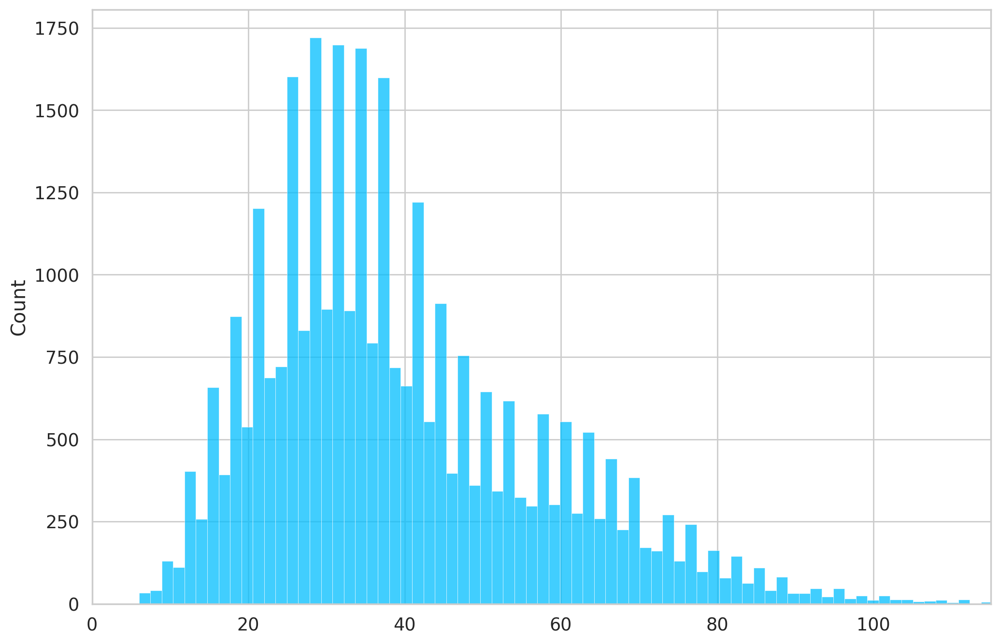

In [ ]:
# Info: Token-Anzahl näher betrachten  (gleiche Code-Quelle wie in vorheriger Code-Zelle)

sns.histplot(token_counts_lv1)
plt.xlim([0, 115]);

### Begutachtung Level 2

In [ ]:
# Info: Token-Anzahl näher betrachten  (gleiche Code-Quelle wie in vorheriger Code-Zelle)

token_counts_lv2 = []

for _, row in train_df_lv2_resampled_ohencoded.iterrows():
  token_count = len(tokenizer.encode(
    row["tweet_text"], 
    max_length=512, 
    truncation=True
  ))
  token_counts_lv2.append(token_count)

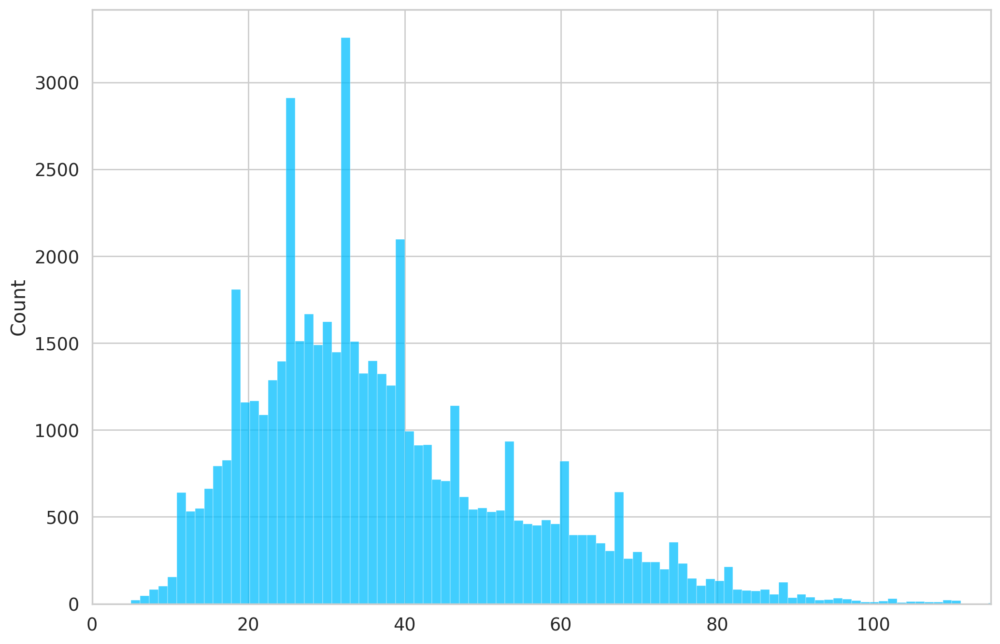

In [ ]:
# Info: Token-Anzahl näher betrachten  (gleiche Code-Quelle wie in vorheriger Code-Zelle)

sns.histplot(token_counts_lv2)
plt.xlim([0, 115]);

### Methode 1

#### Maximale Tokenanzahl festlegen

In [ ]:
MAX_TOKEN_COUNT = 115

#### Spaltenbeschriftungen in Variabeln setzen

In [ ]:
# Info: Token-Anzahl näher betrachten und LABEL_COLUMNS festlegen (gleiche Code-Quelle wie in vorheriger Code-Zelle)

LABEL_COLUMNS_LV1 = train_df_lv1_resampled_ohencoded.columns.tolist()[1:]
LABEL_COLUMNS_LV1

['earthquake', 'floods', 'hurricane', 'wildfires']

In [ ]:
# Info: Token-Anzahl näher betrachten und LABEL_COLUMNS festlegen (gleiche Code-Quelle wie in vorheriger Code-Zelle)

LABEL_COLUMNS_LV2 = train_df_lv2_resampled_ohencoded.columns.tolist()[1:]
LABEL_COLUMNS_LV2

['caution_and_advice',
 'displaced_people_and_evacuations',
 'infrastructure_and_utility_damage',
 'injured_or_dead_people',
 'missing_or_found_people',
 'not_humanitarian',
 'other_relevant_information',
 'requests_or_urgent_needs',
 'rescue_volunteering_or_donation_effort',
 'sympathy_and_support']

In [ ]:
LABEL_COLUMNS_LV2_EQU = train_df_lv2_equ_resampled_ohencoded.columns.tolist()[1:]
LABEL_COLUMNS_LV2_EQU

['caution_and_advice',
 'displaced_people_and_evacuations',
 'infrastructure_and_utility_damage',
 'injured_or_dead_people',
 'not_humanitarian',
 'other_relevant_information',
 'requests_or_urgent_needs',
 'rescue_volunteering_or_donation_effort',
 'sympathy_and_support']

#### Datenset-, Datenmodul- und Kennzeichner-Klasse erstellen

In [ ]:
# Info: Tokenisierungsprozess in eine Klasse verpacken (gleiche Code-Quelle wie in vorheriger Code-Zelle)

class DisasterTweetsDataset(Dataset):

  def __init__(
    self, 
    labelcolumns, #new!
    data: pd.DataFrame, 
    tokenizer: BertTokenizer, 
    max_token_len: int = 128
  ):
    self.tokenizer = tokenizer
    self.data = data
    self.max_token_len = max_token_len
    self.labelcolumns = labelcolumns #new: labelcolumns
    
  def __len__(self):
    return len(self.data)

  def __getitem__(self, index: int):
    data_row = self.data.iloc[index]

    tweet_text = data_row.tweet_text
    labels = data_row[self.labelcolumns] #new: labelcolumns

    encoding = self.tokenizer.encode_plus(
      tweet_text,
      add_special_tokens=True,
      max_length=self.max_token_len,
      return_token_type_ids=False,
      padding="max_length",
      truncation=True,
      return_attention_mask=True,
      return_tensors='pt',
    )

    return dict(
      tweet_text=tweet_text,
      input_ids=encoding["input_ids"].flatten(),
      attention_mask=encoding["attention_mask"].flatten(),
      labels=torch.FloatTensor(labels)
    )

In [ ]:
# Info: Datenmodul-Klasse erstellen (gleiche Code-Quelle wie in vorheriger Code-Zelle)

class DisasterTweetsDataModule(pl.LightningDataModule):

  def __init__(self, train_df, val_df, test_df, tokenizer, labelcolumns, n_workers=2, batch_size=8, max_token_len=128): #change!: val_df, labelcolumns, n_workers
    super().__init__()
    self.batch_size = batch_size
    self.train_df = train_df
    self.val_df = val_df #change!
    self.test_df = test_df
    self.tokenizer = tokenizer
    self.labelcolumns = labelcolumns
    self.n_workers = n_workers
    self.max_token_len = max_token_len

  def setup(self, stage=None):
    self.train_dataset = DisasterTweetsDataset(self.labelcolumns, self.train_df, self.tokenizer, self.max_token_len)
    self.val_dataset = DisasterTweetsDataset(self.labelcolumns, self.val_df, self.tokenizer, self.max_token_len) #new!                                       
    self.test_dataset = DisasterTweetsDataset(self.labelcolumns, self.test_df, self.tokenizer, self.max_token_len)

  def train_dataloader(self):
    return DataLoader(
      self.train_dataset,
      batch_size=self.batch_size,
      shuffle=True,
      num_workers=self.n_workers #PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 12 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
    )

  def val_dataloader(self):
    return DataLoader(
      self.val_dataset, #change!
      batch_size=self.batch_size,
      num_workers=self.n_workers
    )

  def test_dataloader(self):
    return DataLoader(
      self.test_dataset,
      batch_size=self.batch_size,
      num_workers=self.n_workers
    )

In [ ]:
# Info: Kennzeichner-Klasse erstellen (gleiche Code-Quelle wie in vorheriger Code-Zelle)

class DisasterTweetsTagger(pl.LightningModule):

  def __init__(self, n_classes: int, n_training_steps=None, n_warmup_steps=None): #added: train_df
    super().__init__()
    print(f'{ts}: initialization of disaster Tweets Tagger (over-/undersampling method)')
    self.save_hyperparameters() #new! https://lightning.ai/docs/pytorch/latest/common/checkpointing_basic.html
    self.n_classes = n_classes #new!
    self.bert = BertModel.from_pretrained(BERT_MODEL_NAME, return_dict=True)
    self.classifier = nn.Linear(self.bert.config.hidden_size, n_classes)
    self.n_training_steps = n_training_steps
    self.n_warmup_steps = n_warmup_steps
    self.criterion = nn.BCELoss()

    #input1:
    #self.train_df = train_df
    #self.label_counts = {}
    #for col in self.train_df.columns[1:]:
    #        self.label_counts[col] = self.train_df[col].sum()
    #self.class_weights = torch.FloatTensor([1.0 / count for count in self.label_counts.values()]).to(device) #new!
    #self.criterion = nn.BCEWithLogitsLoss(pos_weight=self.class_weights) #statt: self.criterion = nn.BCELoss()

    #input2:
    # class_weights = [0.5281, 0.8411, 0.9619, 0.8634, 0.8477, 0.9577]
    # self.criterion = nn.CrossEntropyLoss(weight = self.class_weights) 
    self.training_step_outputs = [] #new!

  def forward(self, input_ids, attention_mask, labels=None):
    output = self.bert(input_ids, attention_mask=attention_mask)
    output = self.classifier(output.pooler_output)
    output = torch.sigmoid(output)    
    loss = 0
    if labels is not None:
        loss = self.criterion(output, labels)
    return loss, output

  def training_step(self, batch, batch_idx):
    #print(f'{ts}: before starting training step')
    input_ids = batch["input_ids"]
    attention_mask = batch["attention_mask"]
    labels = batch["labels"]
    #print(f'{ts}: training step before forward function') #print timestamp
    loss, outputs = self(input_ids, attention_mask, labels) #make use of forward function
    #print(f'{ts}: training step after forward function')
    self.log("train_loss", loss, prog_bar=True, logger=True)
    self.training_step_outputs.append({"predictions": outputs, "labels": labels}) #new!
    #print(f'{ts}: after starting training step')
    return {"loss": loss, "predictions": outputs, "labels": labels}

  def validation_step(self, batch, batch_idx):
    #print(f'{ts}: before starting validation step')
    input_ids = batch["input_ids"]
    attention_mask = batch["attention_mask"]
    labels = batch["labels"]
    loss, outputs = self(input_ids, attention_mask, labels)
    self.log("val_loss", loss, prog_bar=True, logger=True)
    #print(f'{ts}: after validation step')
    return loss

  def test_step(self, batch, batch_idx):
    #print(f'{ts}: before test step')
    input_ids = batch["input_ids"]
    attention_mask = batch["attention_mask"]
    labels = batch["labels"]
    loss, outputs = self(input_ids, attention_mask, labels)
    self.log("test_loss", loss, prog_bar=True, logger=True)
    #print(f'{ts}: after test step')
    return loss
  
  def on_train_epoch_end(self):
    print(f'{ts}: end of epoch before saving labels and predictions and clearing output cache') #print timestamp
    labels = []
    predictions = []
    for output in self.training_step_outputs:
      for out_labels in output["labels"].detach().cpu():
        labels.append(out_labels) #form: [tensor([0,1,0,0,0,0,0,0,0,0]), tensor([0,1,0,0,0,0,0,1,0,0]), ..., tensor([0,1,0,0,0,0,0,0,0,1])]
      for out_predictions in output["predictions"].detach().cpu():
        predictions.append(out_predictions) #form: [tensor([0.3848,0.0048,0.3848,0.9848,0.0008,0.3848,0.0048,0.3848,0.0048,0.0048]), ...]

    labels_new_nononehot = torch.argmax(torch.stack(labels), dim=1)
    predictions_new = torch.stack(predictions)
    roc_auc_macro = MulticlassAUROC(num_classes=self.n_classes, average="macro", thresholds=None) #change!: self.n_classes
    self.logger.experiment.add_scalar(f"roc_auc/Train", roc_auc_macro(predictions_new, labels_new_nononehot), self.current_epoch)
    #roc_auc_list = MulticlassAUROC(num_classes=10, average=None, thresholds=None)
    #for i, name in enumerate(LABEL_COLUMNS):
    #  self.logger.experiment.add_scalar(f"{name}_roc_auc/Train", roc_auc_list[i], self.current_epoch)

    self.training_step_outputs.clear()
    print(f'{ts}: end of epoch after saving labels and predictions and clearing output cache') #print timestamp


  def configure_optimizers(self):
    optimizer = AdamW(self.parameters(), lr=2e-5)
    scheduler = get_linear_schedule_with_warmup(
      optimizer,
      num_warmup_steps=self.n_warmup_steps,
      num_training_steps=self.n_training_steps
    )

    return dict(
      optimizer=optimizer,
      lr_scheduler=dict(
        scheduler=scheduler,
        interval='step'
      )
    )

#### BERT Modell instanzieren

In [ ]:
# Info: BERT-Modell instanzieren (gleiche Code-Quelle wie in vorheriger Code-Zelle)

#bert_model = BertModel.from_pretrained(BERT_MODEL_NAME, return_dict=True)
#was already in tokenizer: BERT_MODEL_NAME = 'bert-base-cased'

#### Datenmodule instanzieren

In [ ]:
# Info: Datenmodul-Klasse für Level1/2 instanzieren (gleiche Code-Quelle wie in vorheriger Code-Zelle)

# Anzahl an Epochen
EP_LV1 = 10
EP_LV2 = 10
EP_LV2_EQU = 10
EP_LV2_HRC = 10
EP_LV2_FLD = 10
EP_LV2_WFR = 10

# Anzahl der Batch-Größen
BS_LV1 = 12
BS_LV2 = 12
BS_LV2_EQU = 3 #3, weil kleiner Datensatz
BS_LV2_HRC = 10
BS_LV2_FLD = 10
BS_LV2_WFR = 10

# Instanzierung der  Datenmodule
#info: Parameter 'test_df' und 'labelColumns' sind neu!
# für over- undersampling methode:
data_module_lv1 = DisasterTweetsDataModule(train_df_lv1_resampled_ohencoded, val_df_lv1_ohencoded, test_df_lv1_ohencoded, tokenizer, LABEL_COLUMNS_LV1, 4, batch_size=BS_LV1, max_token_len=MAX_TOKEN_COUNT)
data_module_lv2 = DisasterTweetsDataModule(train_df_lv2_resampled_ohencoded, val_df_lv2_ohencoded, test_df_lv2_ohencoded, tokenizer, LABEL_COLUMNS_LV2, 4, batch_size=BS_LV2, max_token_len=MAX_TOKEN_COUNT)
data_module_lv2_equ = DisasterTweetsDataModule(train_df_lv2_equ_resampled_ohencoded, val_df_lv2_equ_ohencoded, test_df_lv2_equ_ohencoded, tokenizer, LABEL_COLUMNS_LV2_EQU, 4, batch_size=BS_LV2_EQU, max_token_len=MAX_TOKEN_COUNT)
data_module_lv2_hrc = DisasterTweetsDataModule(train_df_lv2_hrc_resampled_ohencoded, val_df_lv2_hrc_ohencoded, test_df_lv2_hrc_ohencoded, tokenizer, LABEL_COLUMNS_LV2, 4, batch_size=BS_LV2_HRC, max_token_len=MAX_TOKEN_COUNT)
data_module_lv2_fld = DisasterTweetsDataModule(train_df_lv2_fld_resampled_ohencoded, val_df_lv2_fld_ohencoded, test_df_lv2_fld_ohencoded, tokenizer, LABEL_COLUMNS_LV2, 4, batch_size=BS_LV2_FLD, max_token_len=MAX_TOKEN_COUNT)
data_module_lv2_wfr = DisasterTweetsDataModule(train_df_lv2_wfr_resampled_ohencoded, val_df_lv2_wfr_ohencoded, test_df_lv2_wfr_ohencoded, tokenizer, LABEL_COLUMNS_LV2, 4, batch_size=BS_LV2_WFR, max_token_len=MAX_TOKEN_COUNT)

# for class weights method (not using resampled dataframes)
data_module_lv1_with_class_weights = DisasterTweetsDataModule(train_df_lv1_ohencoded, val_df_lv1_ohencoded, test_df_lv1_ohencoded, tokenizer, LABEL_COLUMNS_LV1, 4, batch_size=BS_LV1, max_token_len=MAX_TOKEN_COUNT)
data_module_lv2_with_class_weights = DisasterTweetsDataModule(train_df_lv2_ohencoded, val_df_lv2_ohencoded, test_df_lv2_ohencoded, tokenizer, LABEL_COLUMNS_LV2, 4, batch_size=BS_LV2, max_token_len=MAX_TOKEN_COUNT)
data_module_lv2_equ_with_class_weights = DisasterTweetsDataModule(train_df_lv2_equ_ohencoded, val_df_lv2_equ_ohencoded, test_df_lv2_equ_ohencoded, tokenizer, LABEL_COLUMNS_LV2_EQU, 4, batch_size=BS_LV2_EQU, max_token_len=MAX_TOKEN_COUNT)
data_module_lv2_hrc_with_class_weights = DisasterTweetsDataModule(train_df_lv2_hrc_ohencoded, val_df_lv2_hrc_ohencoded, test_df_lv2_hrc_ohencoded, tokenizer, LABEL_COLUMNS_LV2, 4, batch_size=BS_LV2_HRC, max_token_len=MAX_TOKEN_COUNT)
data_module_lv2_fld_with_class_weights = DisasterTweetsDataModule(train_df_lv2_fld_ohencoded, val_df_lv2_fld_ohencoded, test_df_lv2_fld_ohencoded, tokenizer, LABEL_COLUMNS_LV2, 4, batch_size=BS_LV2_FLD, max_token_len=MAX_TOKEN_COUNT)
data_module_lv2_wfr_with_class_weights = DisasterTweetsDataModule(train_df_lv2_wfr_ohencoded, val_df_lv2_wfr_ohencoded, test_df_lv2_wfr_ohencoded, tokenizer, LABEL_COLUMNS_LV2, 4, batch_size=BS_LV2_WFR, max_token_len=MAX_TOKEN_COUNT)

#### Trainings-Einstellungen definieren und Kennzeichner-Klasse (bzw. Modell) instanzieren

In [ ]:
# Info: Trainings-Einstellungen definieren und Kennzeichner-Klasse für Level1/2 instanzieren (gleiche Code-Quelle wie in vorheriger Code-Zelle)

def calc_total_train_steps(dataset, batch_size, n_epochs):
  steps_per_epoch = len(dataset) // batch_size
  return steps_per_epoch * n_epochs

model_lv1 = DisasterTweetsTagger(
  n_classes=len(LABEL_COLUMNS_LV1),
  n_warmup_steps=calc_total_train_steps(train_df_lv1_resampled_ohencoded, BS_LV1, EP_LV1),
  n_training_steps=(calc_total_train_steps(train_df_lv1_resampled_ohencoded, BS_LV1, EP_LV1) // 5),
)

model_lv2 = DisasterTweetsTagger(
  n_classes=len(LABEL_COLUMNS_LV2),
  n_warmup_steps=calc_total_train_steps(train_df_lv2_resampled_ohencoded, BS_LV2, EP_LV2),
  n_training_steps=(calc_total_train_steps(train_df_lv2_resampled_ohencoded, BS_LV2, EP_LV2) // 5),
)

model_lv2_equ = DisasterTweetsTagger(
  n_classes=len(LABEL_COLUMNS_LV2_EQU),
  n_warmup_steps=calc_total_train_steps(train_df_lv2_equ_resampled_ohencoded, BS_LV2_EQU, EP_LV2_EQU),
  n_training_steps=(calc_total_train_steps(train_df_lv2_equ_resampled_ohencoded, BS_LV2_EQU, EP_LV2_EQU) // 5),
)

model_lv2_hrc = DisasterTweetsTagger(
  n_classes=len(LABEL_COLUMNS_LV2),
  n_warmup_steps=calc_total_train_steps(train_df_lv2_hrc_resampled_ohencoded, BS_LV2_HRC, EP_LV2_HRC),
  n_training_steps=(calc_total_train_steps(train_df_lv2_hrc_resampled_ohencoded, BS_LV2_HRC, EP_LV2_HRC) // 5),
)

model_lv2_fld = DisasterTweetsTagger(
  n_classes=len(LABEL_COLUMNS_LV2),
  n_warmup_steps=calc_total_train_steps(train_df_lv2_fld_resampled_ohencoded, BS_LV2_FLD, EP_LV2_FLD),
  n_training_steps=(calc_total_train_steps(train_df_lv2_fld_resampled_ohencoded, BS_LV2_FLD, EP_LV2_FLD) // 5),
)

model_lv2_wfr = DisasterTweetsTagger(
  n_classes=len(LABEL_COLUMNS_LV2),
  n_warmup_steps=calc_total_train_steps(train_df_lv2_wfr_resampled_ohencoded, BS_LV2_WFR, EP_LV2_WFR),
  n_training_steps=(calc_total_train_steps(train_df_lv2_wfr_resampled_ohencoded, BS_LV2_WFR, EP_LV2_WFR) // 5),
)



1681730344.99101: initialization of disaster Tweets Tagger (over-/undersampling method)


Some weights of the model checkpoint at bert-base-cased were not used when initializing BertModel: ['cls.predictions.transform.dense.bias', 'cls.seq_relationship.bias', 'cls.predictions.transform.LayerNorm.bias', 'cls.seq_relationship.weight', 'cls.predictions.decoder.weight', 'cls.predictions.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.transform.dense.weight']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


1681730344.99101: initialization of disaster Tweets Tagger (over-/undersampling method)


Some weights of the model checkpoint at bert-base-cased were not used when initializing BertModel: ['cls.predictions.transform.dense.bias', 'cls.seq_relationship.bias', 'cls.predictions.transform.LayerNorm.bias', 'cls.seq_relationship.weight', 'cls.predictions.decoder.weight', 'cls.predictions.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.transform.dense.weight']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


1681730344.99101: initialization of disaster Tweets Tagger (over-/undersampling method)


Some weights of the model checkpoint at bert-base-cased were not used when initializing BertModel: ['cls.predictions.transform.dense.bias', 'cls.seq_relationship.bias', 'cls.predictions.transform.LayerNorm.bias', 'cls.seq_relationship.weight', 'cls.predictions.decoder.weight', 'cls.predictions.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.transform.dense.weight']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


1681730344.99101: initialization of disaster Tweets Tagger (over-/undersampling method)


Some weights of the model checkpoint at bert-base-cased were not used when initializing BertModel: ['cls.predictions.transform.dense.bias', 'cls.seq_relationship.bias', 'cls.predictions.transform.LayerNorm.bias', 'cls.seq_relationship.weight', 'cls.predictions.decoder.weight', 'cls.predictions.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.transform.dense.weight']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


1681730344.99101: initialization of disaster Tweets Tagger (over-/undersampling method)


Some weights of the model checkpoint at bert-base-cased were not used when initializing BertModel: ['cls.predictions.transform.dense.bias', 'cls.seq_relationship.bias', 'cls.predictions.transform.LayerNorm.bias', 'cls.seq_relationship.weight', 'cls.predictions.decoder.weight', 'cls.predictions.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.transform.dense.weight']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


1681730344.99101: initialization of disaster Tweets Tagger (over-/undersampling method)


Some weights of the model checkpoint at bert-base-cased were not used when initializing BertModel: ['cls.predictions.transform.dense.bias', 'cls.seq_relationship.bias', 'cls.predictions.transform.LayerNorm.bias', 'cls.seq_relationship.weight', 'cls.predictions.decoder.weight', 'cls.predictions.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.transform.dense.weight']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


### Methode 2

#### Datenset-, Datenmodul- und Kennzeichner-Klasse erstellen

In [ ]:
# Info: Kennzeichner-Klasse erstellen (gleiche Code-Quelle wie in vorheriger Code-Zelle)

class DisasterTweetsTagger_WithClassWeights(pl.LightningModule):

  def __init__(self, n_classes: int, class_weights, n_training_steps=None, n_warmup_steps=None): #added: class_weights
    super().__init__()
    print(f'{ts}: initialization of disaster Tweets Tagger with class weights')
    self.save_hyperparameters() #new! https://lightning.ai/docs/pytorch/latest/common/checkpointing_basic.html
    self.n_classes = n_classes #new!
    self.bert = BertModel.from_pretrained(BERT_MODEL_NAME, return_dict=True)
    self.classifier = nn.Linear(self.bert.config.hidden_size, n_classes)
    self.n_training_steps = n_training_steps
    self.n_warmup_steps = n_warmup_steps
    self.class_weights = class_weights #new!
    #self.criterion = nn.CrossEntropyLoss(weight = class_weights)
    self.criterion = nn.CrossEntropyLoss(weight = class_weights)  
    self.training_step_outputs = [] #new!

  def forward(self, input_ids, attention_mask, labels=None):
    output = self.bert(input_ids, attention_mask=attention_mask)
    output = self.classifier(output.pooler_output)
    output = torch.sigmoid(output)    
    loss = 0
    if labels is not None:
        loss = self.criterion(output, labels)
    return loss, output

  def training_step(self, batch, batch_idx):
    #print(f'{ts}: before starting training step')
    input_ids = batch["input_ids"]
    attention_mask = batch["attention_mask"]
    labels = batch["labels"]
    #print(f'{ts}: training step before forward function') #print timestamp
    loss, outputs = self(input_ids, attention_mask, labels) #make use of forward function
    #print(f'{ts}: training step after forward function')
    self.log("train_loss", loss, prog_bar=True, logger=True)
    self.training_step_outputs.append({"predictions": outputs, "labels": labels}) #new!
    #print(f'{ts}: after starting training step')
    return {"loss": loss, "predictions": outputs, "labels": labels}

  def validation_step(self, batch, batch_idx):
    #print(f'{ts}: before starting validation step')
    input_ids = batch["input_ids"]
    attention_mask = batch["attention_mask"]
    labels = batch["labels"]
    loss, outputs = self(input_ids, attention_mask, labels)
    self.log("val_loss", loss, prog_bar=True, logger=True)
    #print(f'{ts}: after validation step')
    return loss

  def test_step(self, batch, batch_idx):
    #print(f'{ts}: before test step')
    input_ids = batch["input_ids"]
    attention_mask = batch["attention_mask"]
    labels = batch["labels"]
    loss, outputs = self(input_ids, attention_mask, labels)
    self.log("test_loss", loss, prog_bar=True, logger=True)
    #print(f'{ts}: after test step')
    return loss
  
  def on_train_epoch_end(self):
    print(f'{ts}: end of epoch before saving labels and predictions and clearing output cache') #print timestamp
    labels = []
    predictions = []
    for output in self.training_step_outputs:
      for out_labels in output["labels"].detach().cpu():
        labels.append(out_labels) #form: [tensor([0,1,0,0,0,0,0,0,0,0]), tensor([0,1,0,0,0,0,0,1,0,0]), ..., tensor([0,1,0,0,0,0,0,0,0,1])]
      for out_predictions in output["predictions"].detach().cpu():
        predictions.append(out_predictions) #form: [tensor([0.3848,0.0048,0.3848,0.9848,0.0008,0.3848,0.0048,0.3848,0.0048,0.0048]), ...]

    labels_new_nononehot = torch.argmax(torch.stack(labels), dim=1)
    predictions_new = torch.stack(predictions)
    roc_auc_macro = MulticlassAUROC(num_classes=self.n_classes, average="macro", thresholds=None) #change!: self.n_classes
    self.logger.experiment.add_scalar(f"roc_auc/Train", roc_auc_macro(predictions_new, labels_new_nononehot), self.current_epoch)
    #roc_auc_list = MulticlassAUROC(num_classes=10, average=None, thresholds=None)
    #for i, name in enumerate(LABEL_COLUMNS):
    #  self.logger.experiment.add_scalar(f"{name}_roc_auc/Train", roc_auc_list[i], self.current_epoch)

    self.training_step_outputs.clear()
    print(f'{ts}: end of epoch after saving labels and predictions and clearing output cache') #print timestamp


  def configure_optimizers(self):
    optimizer = AdamW(self.parameters(), lr=2e-5)
    scheduler = get_linear_schedule_with_warmup(
      optimizer,
      num_warmup_steps=self.n_warmup_steps,
      num_training_steps=self.n_training_steps
    )

    return dict(
      optimizer=optimizer,
      lr_scheduler=dict(
        scheduler=scheduler,
        interval='step'
      )
    )

#### Klassengewichte berechnen

In [ ]:
def create_disaster_class_weights(df, label_column_name):
  labels = sorted(df[label_column_name].tolist()) #sorted, because then they are sorted by ABC and in same sorting as wished for
  class_weights = torch.from_numpy(class_weight.compute_class_weight('balanced',
                                                                     classes=pd.unique(labels), 
                                                                     y=labels))
  return class_weights

label_name_event_type = 'event_type_label'
label_name_class_type = 'class_label'

#### Kennzeichner-Klasse (bzw. Modell) instanzieren

In [ ]:
model_lv1_with_class_weights = DisasterTweetsTagger_WithClassWeights(
  n_classes=len(LABEL_COLUMNS_LV1),
  class_weights=create_disaster_class_weights(train_df_lv1,label_name_event_type), #non-resampled version
  n_warmup_steps=calc_total_train_steps(train_df_lv1_ohencoded, BS_LV1, EP_LV1), #non-resampled version
  n_training_steps=(calc_total_train_steps(train_df_lv1_ohencoded, BS_LV1, EP_LV1) // 5), #non-resampled version
)

model_lv2_with_class_weights = DisasterTweetsTagger_WithClassWeights(
  n_classes=len(LABEL_COLUMNS_LV2),
  class_weights=create_disaster_class_weights(train_df_lv2,label_name_class_type), #non-resampled version
  n_warmup_steps=calc_total_train_steps(train_df_lv2_ohencoded, BS_LV2, EP_LV2), #non-resampled version
  n_training_steps=(calc_total_train_steps(train_df_lv2_ohencoded, BS_LV2, EP_LV2) // 5), #non-resampled version
)

model_lv2_equ_with_class_weights = DisasterTweetsTagger_WithClassWeights(
  n_classes=len(LABEL_COLUMNS_LV2_EQU),
  class_weights=create_disaster_class_weights(train_df_lv2_equ,label_name_class_type), #non-resampled version
  n_warmup_steps=calc_total_train_steps(train_df_lv2_equ_ohencoded, BS_LV2_EQU, EP_LV2_EQU), #non-resampled version
  n_training_steps=(calc_total_train_steps(train_df_lv2_equ_ohencoded, BS_LV2_EQU, EP_LV2_EQU) // 5), #non-resampled version
)

model_lv2_hrc_with_class_weights = DisasterTweetsTagger_WithClassWeights(
  n_classes=len(LABEL_COLUMNS_LV2),
  class_weights=create_disaster_class_weights(train_df_lv2_hrc,label_name_class_type), #non-resampled version
  n_warmup_steps=calc_total_train_steps(train_df_lv2_hrc_ohencoded, BS_LV2_HRC, EP_LV2_HRC), #non-resampled version
  n_training_steps=(calc_total_train_steps(train_df_lv2_hrc_ohencoded, BS_LV2_HRC, EP_LV2_HRC) // 5), #non-resampled version
)

model_lv2_fld_with_class_weights = DisasterTweetsTagger_WithClassWeights(
  n_classes=len(LABEL_COLUMNS_LV2),
  class_weights=create_disaster_class_weights(train_df_lv2_fld,label_name_class_type), #non-resampled version
  n_warmup_steps=calc_total_train_steps(train_df_lv2_fld_ohencoded, BS_LV2_FLD, EP_LV2_FLD), #non-resampled version
  n_training_steps=(calc_total_train_steps(train_df_lv2_fld_ohencoded, BS_LV2_FLD, EP_LV2_FLD) // 5), #non-resampled version
)

model_lv2_wfr_with_class_weights = DisasterTweetsTagger_WithClassWeights(
  n_classes=len(LABEL_COLUMNS_LV2),
  class_weights=create_disaster_class_weights(train_df_lv2_wfr,label_name_class_type), #non-resampled version
  n_warmup_steps=calc_total_train_steps(train_df_lv2_wfr_ohencoded, BS_LV2_WFR, EP_LV2_WFR), #non-resampled version
  n_training_steps=(calc_total_train_steps(train_df_lv2_wfr_ohencoded, BS_LV2_WFR, EP_LV2_WFR) // 5), #non-resampled version
)

1681730344.99101: initialization of disaster Tweets Tagger with class weights


Some weights of the model checkpoint at bert-base-cased were not used when initializing BertModel: ['cls.predictions.transform.dense.bias', 'cls.seq_relationship.bias', 'cls.predictions.transform.LayerNorm.bias', 'cls.seq_relationship.weight', 'cls.predictions.decoder.weight', 'cls.predictions.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.transform.dense.weight']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


1681730344.99101: initialization of disaster Tweets Tagger with class weights


Some weights of the model checkpoint at bert-base-cased were not used when initializing BertModel: ['cls.predictions.transform.dense.bias', 'cls.seq_relationship.bias', 'cls.predictions.transform.LayerNorm.bias', 'cls.seq_relationship.weight', 'cls.predictions.decoder.weight', 'cls.predictions.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.transform.dense.weight']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


1681730344.99101: initialization of disaster Tweets Tagger with class weights


Some weights of the model checkpoint at bert-base-cased were not used when initializing BertModel: ['cls.predictions.transform.dense.bias', 'cls.seq_relationship.bias', 'cls.predictions.transform.LayerNorm.bias', 'cls.seq_relationship.weight', 'cls.predictions.decoder.weight', 'cls.predictions.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.transform.dense.weight']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


1681730344.99101: initialization of disaster Tweets Tagger with class weights


Some weights of the model checkpoint at bert-base-cased were not used when initializing BertModel: ['cls.predictions.transform.dense.bias', 'cls.seq_relationship.bias', 'cls.predictions.transform.LayerNorm.bias', 'cls.seq_relationship.weight', 'cls.predictions.decoder.weight', 'cls.predictions.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.transform.dense.weight']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


1681730344.99101: initialization of disaster Tweets Tagger with class weights


Some weights of the model checkpoint at bert-base-cased were not used when initializing BertModel: ['cls.predictions.transform.dense.bias', 'cls.seq_relationship.bias', 'cls.predictions.transform.LayerNorm.bias', 'cls.seq_relationship.weight', 'cls.predictions.decoder.weight', 'cls.predictions.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.transform.dense.weight']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


1681730344.99101: initialization of disaster Tweets Tagger with class weights


Some weights of the model checkpoint at bert-base-cased were not used when initializing BertModel: ['cls.predictions.transform.dense.bias', 'cls.seq_relationship.bias', 'cls.predictions.transform.LayerNorm.bias', 'cls.seq_relationship.weight', 'cls.predictions.decoder.weight', 'cls.predictions.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.transform.dense.weight']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


In [ ]:
label_name_class_type = 'class_label'

model_lv2_equ_ordinal_labels_with_class_weights = DisasterTweetsTagger_WithClassWeights(
  n_classes=len(LABEL_COLUMNS_LV2_EQU),
  class_weights=create_disaster_class_weights(train_df_lv2_equ,label_name_class_type), #non-resampled version
  n_warmup_steps=calc_total_train_steps(train_df_lv2_equ_ordinal_labels, BS_LV2_EQU, EP_LV2_EQU), #non-resampled version
  n_training_steps=(calc_total_train_steps(train_df_lv2_equ_ordinal_labels, BS_LV2_EQU, EP_LV2_EQU) // 5), #non-resampled version
)

1681730344.99101: initialization of disaster Tweets Tagger with class weights


Some weights of the model checkpoint at bert-base-cased were not used when initializing BertModel: ['cls.predictions.transform.dense.bias', 'cls.seq_relationship.bias', 'cls.predictions.transform.LayerNorm.bias', 'cls.seq_relationship.weight', 'cls.predictions.decoder.weight', 'cls.predictions.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.transform.dense.weight']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


## Tensorboard initiieren, Callbacks und Trainer definieren



In [ ]:
# Info: Entfernen von 'lightning_logs' und 'checkpoints' (gleiche Code-Quelle wie in vorheriger Code-Zelle)

!rm -rf lightning_logs/
!rm -rf checkpoints/

In [ ]:
# Info: Tensorboard initiieren und Log-Lokation definieren (gleiche Code-Quelle wie in vorheriger Code-Zelle)

%load_ext tensorboard
%tensorboard --logdir ./lightning_logs

<IPython.core.display.Javascript object>

In [ ]:
# logger:
logger = TensorBoardLogger("lightning_logs", name="disaster-tweets")

In [ ]:
# Info: Callbacks instanzieren (gleiche Code-Quelle wie in vorheriger Code-Zelle)

# callbacks:
# changes: #new!change! before the dirpath was: "checkpoints"
def create_checkpoint_callback(datasetname):
  return ModelCheckpoint(
  dirpath="/content/drive/MyDrive/TransformingDisasterTweets/Checkpoints", 
  filename = datasetname, 
  save_top_k=1, 
  verbose=True, 
  monitor="val_loss", 
  mode="min"
  )
  
early_stopping_callback = EarlyStopping(monitor='val_loss', patience=2)

class TimeLoggerCallback(pl.Callback):
    def on_train_start(self, trainer, pl_module):
        self.train_start_time = time.time()
    
    def on_train_epoch_end(self, trainer, pl_module):
        epoch_time = time.time() - self.train_start_time
        trainer.logger.log_metrics({"train_epoch_time": epoch_time}, step=trainer.current_epoch)

time_logger_callback = TimeLoggerCallback()

In [ ]:
# Info: Trainer instanzieren (gleiche Code-Quelle wie in vorheriger Code-Zelle)

# Änderungen:
  # does not work anymore -> checkpoint_callback=checkpoint_callback, update of Trainer API here: https://discuss.huggingface.co/t/typeerror-init-got-an-unexpected-keyword-argument-checkpoint-callback/21542
  # does not work anymore -> gpus=1, update: https://lightning.ai/docs/pytorch/stable/common/trainer.html
  # does not work anymore -> progress_bar_refresh_rate=30, just let it out completely

trainer_lv1 = pl.Trainer(logger=logger, callbacks=[early_stopping_callback, create_checkpoint_callback('train_df_lv1_resampled_ohencoded'), time_logger_callback], max_epochs=EP_LV1, num_nodes=1)
trainer_lv2 = pl.Trainer(logger=logger, callbacks=[early_stopping_callback, create_checkpoint_callback('train_df_lv2_resampled_ohencoded'), time_logger_callback], max_epochs=EP_LV2, num_nodes=1)
trainer_lv2_equ = pl.Trainer(logger=logger, callbacks=[early_stopping_callback, create_checkpoint_callback('train_df_lv2_equ_resampled_ohencoded'), time_logger_callback], max_epochs=EP_LV2_EQU, num_nodes=1)
trainer_lv2_hrc = pl.Trainer(logger=logger, callbacks=[early_stopping_callback, create_checkpoint_callback('train_df_lv2_hrc_resampled_ohencoded'), time_logger_callback], max_epochs=EP_LV2_HRC, num_nodes=1)
trainer_lv2_fld = pl.Trainer(logger=logger, callbacks=[early_stopping_callback, create_checkpoint_callback('train_df_lv2_fld_resampled_ohencoded'), time_logger_callback], max_epochs=EP_LV2_FLD, num_nodes=1)
trainer_lv2_wfr = pl.Trainer(logger=logger, callbacks=[early_stopping_callback, create_checkpoint_callback('train_df_lv2_wfr_resampled_ohencoded'), time_logger_callback], max_epochs=EP_LV2_WFR, num_nodes=1)

trainer_lv1_with_class_weights = pl.Trainer(logger=logger, callbacks=[early_stopping_callback, create_checkpoint_callback('train_df_lv1_ohencoded_with_class_weights'), time_logger_callback], max_epochs=EP_LV1, num_nodes=1)
trainer_lv2_with_class_weights = pl.Trainer(logger=logger, callbacks=[early_stopping_callback, create_checkpoint_callback('train_df_lv2_ohencoded_with_class_weights'), time_logger_callback], max_epochs=EP_LV2, num_nodes=1)
trainer_lv2_equ_with_class_weights = pl.Trainer(logger=logger, callbacks=[early_stopping_callback, create_checkpoint_callback('train_df_lv2_equ_ohencoded_with_class_weights'), time_logger_callback], max_epochs=EP_LV2_EQU, num_nodes=1)
trainer_lv2_hrc_with_class_weights = pl.Trainer(logger=logger, callbacks=[early_stopping_callback, create_checkpoint_callback('train_df_lv2_hrc_ohencoded_with_class_weights'), time_logger_callback], max_epochs=EP_LV2_HRC, num_nodes=1)
trainer_lv2_fld_with_class_weights = pl.Trainer(logger=logger, callbacks=[early_stopping_callback, create_checkpoint_callback('train_df_lv2_fld_ohencoded_with_class_weights'), time_logger_callback], max_epochs=EP_LV2_FLD, num_nodes=1)
trainer_lv2_wfr_with_class_weights = pl.Trainer(logger=logger, callbacks=[early_stopping_callback, create_checkpoint_callback('train_df_lv2_wfr_ohencoded_with_class_weights'), time_logger_callback], max_epochs=EP_LV2_WFR, num_nodes=1)

trainer_lv3_equ_ordinal_labels_with_class_weights =  pl.Trainer(logger=logger, callbacks=[early_stopping_callback, create_checkpoint_callback('train_df_lv2_equ_ordinal_labels_with_class_weights'), time_logger_callback], max_epochs=EP_LV2_EQU, num_nodes=1)

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utili

# Training, Test und Evaluation

## Modell-Training und -Validierung

### Durchgang 1: mit Over- und Undersampled Daten

In [ ]:
# Info: Modelle trainieren (gleiche Code-Quelle wie in vorheriger Code-Zelle)

trainer_lv1.fit(model_lv1, datamodule=data_module_lv1)

/usr/local/lib/python3.9/dist-packages/pytorch_lightning/callbacks/model_checkpoint.py:612: UserWarning: Checkpoint directory /content/drive/MyDrive/TransformingDisasterTweets/Checkpoints exists and is not empty.
  rank_zero_warn(f"Checkpoint directory {dirpath} exists and is not empty.")
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/usr/local/lib/python3.9/dist-packages/transformers/optimization.py:391: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  warnings.warn(
INFO:pytorch_lightning.callbacks.model_summary:
  | Name       | Type      | Params
-----------------------------------------
0 | bert       | BertModel | 108 M 
1 | classifier | Linear    | 3.1 K 
2 | criterion  | BCELoss   | 0     
-----------------------------------------
108 M     Trainable params
0         Non-tr

Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 0, global step 2605: 'val_loss' reached 0.10856 (best 0.10856), saving model to '/content/drive/MyDrive/TransformingDisasterTweets/Checkpoints/train_df_lv1_resampled_ohencoded-v1.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 1, global step 5210: 'val_loss' reached 0.06207 (best 0.06207), saving model to '/content/drive/MyDrive/TransformingDisasterTweets/Checkpoints/train_df_lv1_resampled_ohencoded-v1.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 2, global step 7815: 'val_loss' reached 0.04661 (best 0.04661), saving model to '/content/drive/MyDrive/TransformingDisasterTweets/Checkpoints/train_df_lv1_resampled_ohencoded-v1.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 3, global step 10420: 'val_loss' was not in top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 4, global step 13025: 'val_loss' was not in top 1


In [ ]:
# Info: Double Check ob Validation Loss ähnlich ist
# Code-Quelle: Pytorch Lightning Docs
# Link: https://lightning.ai/docs/pytorch/stable/common/trainer.html

# vorher ohne Parameter ausführen, dann Fehlermeldung, dann mit Parameter ausführen
trainer_lv1.validate(model_lv1, datamodule=data_module_lv1)

INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Validation: 0it [00:00, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃      Validate metric      ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         val_loss          │    0.04660993069410324    │
└───────────────────────────┴───────────────────────────┘

[{'val_loss': 0.04660993069410324}]

In [ ]:
trainer_lv2.fit(model_lv2, datamodule=data_module_lv2)

INFO:pytorch_lightning.utilities.rank_zero:You are using a CUDA device ('NVIDIA A100-SXM4-40GB') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
/usr/local/lib/python3.9/dist-packages/pytorch_lightning/callbacks/model_checkpoint.py:612: UserWarning: Checkpoint directory /content/drive/MyDrive/TransformingDisasterTweets/Checkpoints exists and is not empty.
  rank_zero_warn(f"Checkpoint directory {dirpath} exists and is not empty.")
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/usr/local/lib/python3.9/dist-packages/transformers/optimization.py:391: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW i

Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 0, global step 4461: 'val_loss' reached 0.20089 (best 0.20089), saving model to '/content/drive/MyDrive/TransformingDisasterTweets/Checkpoints/train_df_lv2_resampled_ohencoded-v1.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 1, global step 8922: 'val_loss' reached 0.13354 (best 0.13354), saving model to '/content/drive/MyDrive/TransformingDisasterTweets/Checkpoints/train_df_lv2_resampled_ohencoded-v1.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 2, global step 13383: 'val_loss' reached 0.12012 (best 0.12012), saving model to '/content/drive/MyDrive/TransformingDisasterTweets/Checkpoints/train_df_lv2_resampled_ohencoded-v1.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 3, global step 17844: 'val_loss' was not in top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 4, global step 22305: 'val_loss' was not in top 1


In [ ]:
trainer_lv2.validate(model_lv2, datamodule=data_module_lv2)

INFO:pytorch_lightning.utilities.rank_zero:You are using a CUDA device ('NVIDIA A100-SXM4-40GB') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Validation: 0it [00:00, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃      Validate metric      ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         val_loss          │    0.1378478705883026     │
└───────────────────────────┴───────────────────────────┘

[{'val_loss': 0.1378478705883026}]

In [ ]:
trainer_lv2_equ.fit(model_lv2_equ, datamodule=data_module_lv2_equ)

INFO:pytorch_lightning.utilities.rank_zero:You are using a CUDA device ('NVIDIA A100-SXM4-40GB') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
/usr/local/lib/python3.9/dist-packages/pytorch_lightning/callbacks/model_checkpoint.py:612: UserWarning: Checkpoint directory /content/drive/MyDrive/TransformingDisasterTweets/Checkpoints exists and is not empty.
  rank_zero_warn(f"Checkpoint directory {dirpath} exists and is not empty.")
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/usr/local/lib/python3.9/dist-packages/transformers/optimization.py:391: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW i

Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 0, global step 2082: 'val_loss' reached 0.32474 (best 0.32474), saving model to '/content/drive/MyDrive/TransformingDisasterTweets/Checkpoints/train_df_lv2_equ_resampled_ohencoded-v2.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 1, global step 4164: 'val_loss' reached 0.17797 (best 0.17797), saving model to '/content/drive/MyDrive/TransformingDisasterTweets/Checkpoints/train_df_lv2_equ_resampled_ohencoded-v2.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 2, global step 6246: 'val_loss' reached 0.13120 (best 0.13120), saving model to '/content/drive/MyDrive/TransformingDisasterTweets/Checkpoints/train_df_lv2_equ_resampled_ohencoded-v2.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 3, global step 8328: 'val_loss' was not in top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 4, global step 10410: 'val_loss' reached 0.12702 (best 0.12702), saving model to '/content/drive/MyDrive/TransformingDisasterTweets/Checkpoints/train_df_lv2_equ_resampled_ohencoded-v2.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 5, global step 12492: 'val_loss' was not in top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 6, global step 14574: 'val_loss' was not in top 1


In [ ]:
trainer_lv2_equ.validate(model_lv2_equ, datamodule=data_module_lv2_equ)

INFO:pytorch_lightning.utilities.rank_zero:You are using a CUDA device ('NVIDIA A100-SXM4-40GB') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Validation: 0it [00:00, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃      Validate metric      ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         val_loss          │    0.1270155906677246     │
└───────────────────────────┴───────────────────────────┘

[{'val_loss': 0.1270155906677246}]

In [ ]:
trainer_lv2_hrc.fit(model_lv2_hrc, datamodule=data_module_lv2_hrc)

INFO:pytorch_lightning.utilities.rank_zero:You are using a CUDA device ('NVIDIA A100-SXM4-40GB') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
/usr/local/lib/python3.9/dist-packages/pytorch_lightning/callbacks/model_checkpoint.py:612: UserWarning: Checkpoint directory /content/drive/MyDrive/TransformingDisasterTweets/Checkpoints exists and is not empty.
  rank_zero_warn(f"Checkpoint directory {dirpath} exists and is not empty.")
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/usr/local/lib/python3.9/dist-packages/transformers/optimization.py:391: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW i

Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 0, global step 3167: 'val_loss' reached 0.23820 (best 0.23820), saving model to '/content/drive/MyDrive/TransformingDisasterTweets/Checkpoints/train_df_lv2_hrc_resampled_ohencoded-v1.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 1, global step 6334: 'val_loss' reached 0.15049 (best 0.15049), saving model to '/content/drive/MyDrive/TransformingDisasterTweets/Checkpoints/train_df_lv2_hrc_resampled_ohencoded-v1.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 2, global step 9501: 'val_loss' reached 0.13588 (best 0.13588), saving model to '/content/drive/MyDrive/TransformingDisasterTweets/Checkpoints/train_df_lv2_hrc_resampled_ohencoded-v1.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 3, global step 12668: 'val_loss' was not in top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 4, global step 15835: 'val_loss' was not in top 1


In [ ]:
trainer_lv2_hrc.validate(model_lv2_hrc, datamodule=data_module_lv2_hrc)

INFO:pytorch_lightning.utilities.rank_zero:You are using a CUDA device ('NVIDIA A100-SXM4-40GB') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Validation: 0it [00:00, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃      Validate metric      ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         val_loss          │    0.13587889075279236    │
└───────────────────────────┴───────────────────────────┘

[{'val_loss': 0.13587889075279236}]

In [ ]:
trainer_lv2_fld.fit(model_lv2_fld, datamodule=data_module_lv2_fld)

INFO:pytorch_lightning.utilities.rank_zero:You are using a CUDA device ('NVIDIA A100-SXM4-40GB') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
/usr/local/lib/python3.9/dist-packages/pytorch_lightning/callbacks/model_checkpoint.py:612: UserWarning: Checkpoint directory /content/drive/MyDrive/TransformingDisasterTweets/Checkpoints exists and is not empty.
  rank_zero_warn(f"Checkpoint directory {dirpath} exists and is not empty.")
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/usr/local/lib/python3.9/dist-packages/transformers/optimization.py:391: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW i

Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 0, global step 781: 'val_loss' reached 0.33028 (best 0.33028), saving model to '/content/drive/MyDrive/TransformingDisasterTweets/Checkpoints/train_df_lv2_fld_resampled_ohencoded-v1.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 1, global step 1562: 'val_loss' reached 0.28194 (best 0.28194), saving model to '/content/drive/MyDrive/TransformingDisasterTweets/Checkpoints/train_df_lv2_fld_resampled_ohencoded-v1.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 2, global step 2343: 'val_loss' reached 0.19163 (best 0.19163), saving model to '/content/drive/MyDrive/TransformingDisasterTweets/Checkpoints/train_df_lv2_fld_resampled_ohencoded-v1.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 3, global step 3124: 'val_loss' reached 0.15989 (best 0.15989), saving model to '/content/drive/MyDrive/TransformingDisasterTweets/Checkpoints/train_df_lv2_fld_resampled_ohencoded-v1.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 4, global step 3905: 'val_loss' reached 0.15803 (best 0.15803), saving model to '/content/drive/MyDrive/TransformingDisasterTweets/Checkpoints/train_df_lv2_fld_resampled_ohencoded-v1.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 5, global step 4686: 'val_loss' was not in top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 6, global step 5467: 'val_loss' was not in top 1


In [ ]:
trainer_lv2_fld.validate(model_lv2_fld, datamodule=data_module_lv2_fld)

INFO:pytorch_lightning.utilities.rank_zero:You are using a CUDA device ('NVIDIA A100-SXM4-40GB') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Validation: 0it [00:00, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃      Validate metric      ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         val_loss          │    0.1580336093902588     │
└───────────────────────────┴───────────────────────────┘

[{'val_loss': 0.1580336093902588}]

In [ ]:
trainer_lv2_wfr.fit(model_lv2_wfr, datamodule=data_module_lv2_wfr)

INFO:pytorch_lightning.utilities.rank_zero:You are using a CUDA device ('NVIDIA A100-SXM4-40GB') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
/usr/local/lib/python3.9/dist-packages/pytorch_lightning/callbacks/model_checkpoint.py:612: UserWarning: Checkpoint directory /content/drive/MyDrive/TransformingDisasterTweets/Checkpoints exists and is not empty.
  rank_zero_warn(f"Checkpoint directory {dirpath} exists and is not empty.")
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/usr/local/lib/python3.9/dist-packages/transformers/optimization.py:391: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW i

Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 0, global step 779: 'val_loss' reached 0.32707 (best 0.32707), saving model to '/content/drive/MyDrive/TransformingDisasterTweets/Checkpoints/train_df_lv2_wfr_resampled_ohencoded.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 1, global step 1558: 'val_loss' reached 0.21779 (best 0.21779), saving model to '/content/drive/MyDrive/TransformingDisasterTweets/Checkpoints/train_df_lv2_wfr_resampled_ohencoded.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 2, global step 2337: 'val_loss' reached 0.15256 (best 0.15256), saving model to '/content/drive/MyDrive/TransformingDisasterTweets/Checkpoints/train_df_lv2_wfr_resampled_ohencoded.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 3, global step 3116: 'val_loss' reached 0.13037 (best 0.13037), saving model to '/content/drive/MyDrive/TransformingDisasterTweets/Checkpoints/train_df_lv2_wfr_resampled_ohencoded.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 4, global step 3895: 'val_loss' reached 0.12800 (best 0.12800), saving model to '/content/drive/MyDrive/TransformingDisasterTweets/Checkpoints/train_df_lv2_wfr_resampled_ohencoded.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 5, global step 4674: 'val_loss' was not in top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 6, global step 5453: 'val_loss' was not in top 1


In [ ]:
trainer_lv2_wfr.validate(model_lv2_wfr, datamodule=data_module_lv2_wfr)

INFO:pytorch_lightning.utilities.rank_zero:You are using a CUDA device ('NVIDIA A100-SXM4-40GB') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Validation: 0it [00:00, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃      Validate metric      ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         val_loss          │    0.12800385057926178    │
└───────────────────────────┴───────────────────────────┘

[{'val_loss': 0.12800385057926178}]

###Durchgang 2: mit gewichteter Verlustfunktion

In [ ]:
# Info: Modelle trainieren (gleiche Code-Quelle wie in vorheriger Code-Zelle)

trainer_lv2_equ_with_class_weights.fit(model_lv2_equ_with_class_weights, datamodule=data_module_lv2_equ_with_class_weights)

INFO:pytorch_lightning.utilities.rank_zero:You are using a CUDA device ('NVIDIA A100-SXM4-40GB') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
/usr/local/lib/python3.9/dist-packages/pytorch_lightning/callbacks/model_checkpoint.py:612: UserWarning: Checkpoint directory /content/drive/MyDrive/TransformingDisasterTweets/Checkpoints exists and is not empty.
  rank_zero_warn(f"Checkpoint directory {dirpath} exists and is not empty.")
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/usr/local/lib/python3.9/dist-packages/transformers/optimization.py:391: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW i

Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

1681658112.7455409: end of epoch before saving labels and predictions and clearing output cache


INFO:pytorch_lightning.utilities.rank_zero:Epoch 0, global step 2084: 'val_loss' reached 2.04880 (best 2.04880), saving model to '/content/drive/MyDrive/TransformingDisasterTweets/Checkpoints/train_df_lv2_equ_ohencoded_with_class_weights.ckpt' as top 1


1681658112.7455409: end of epoch after saving labels and predictions and clearing output cache


Validation: 0it [00:00, ?it/s]

1681658112.7455409: end of epoch before saving labels and predictions and clearing output cache


INFO:pytorch_lightning.utilities.rank_zero:Epoch 1, global step 4168: 'val_loss' reached 1.76398 (best 1.76398), saving model to '/content/drive/MyDrive/TransformingDisasterTweets/Checkpoints/train_df_lv2_equ_ohencoded_with_class_weights.ckpt' as top 1


1681658112.7455409: end of epoch after saving labels and predictions and clearing output cache


Validation: 0it [00:00, ?it/s]

1681658112.7455409: end of epoch before saving labels and predictions and clearing output cache


INFO:pytorch_lightning.utilities.rank_zero:Epoch 2, global step 6252: 'val_loss' reached 1.65003 (best 1.65003), saving model to '/content/drive/MyDrive/TransformingDisasterTweets/Checkpoints/train_df_lv2_equ_ohencoded_with_class_weights.ckpt' as top 1


1681658112.7455409: end of epoch after saving labels and predictions and clearing output cache


Validation: 0it [00:00, ?it/s]

1681658112.7455409: end of epoch before saving labels and predictions and clearing output cache


INFO:pytorch_lightning.utilities.rank_zero:Epoch 3, global step 8336: 'val_loss' reached 1.59501 (best 1.59501), saving model to '/content/drive/MyDrive/TransformingDisasterTweets/Checkpoints/train_df_lv2_equ_ohencoded_with_class_weights.ckpt' as top 1


1681658112.7455409: end of epoch after saving labels and predictions and clearing output cache


Validation: 0it [00:00, ?it/s]

1681658112.7455409: end of epoch before saving labels and predictions and clearing output cache


INFO:pytorch_lightning.utilities.rank_zero:Epoch 4, global step 10420: 'val_loss' reached 1.58948 (best 1.58948), saving model to '/content/drive/MyDrive/TransformingDisasterTweets/Checkpoints/train_df_lv2_equ_ohencoded_with_class_weights.ckpt' as top 1


1681658112.7455409: end of epoch after saving labels and predictions and clearing output cache


Validation: 0it [00:00, ?it/s]

1681658112.7455409: end of epoch before saving labels and predictions and clearing output cache


INFO:pytorch_lightning.utilities.rank_zero:Epoch 5, global step 12504: 'val_loss' reached 1.55889 (best 1.55889), saving model to '/content/drive/MyDrive/TransformingDisasterTweets/Checkpoints/train_df_lv2_equ_ohencoded_with_class_weights.ckpt' as top 1


1681658112.7455409: end of epoch after saving labels and predictions and clearing output cache


Validation: 0it [00:00, ?it/s]

1681658112.7455409: end of epoch before saving labels and predictions and clearing output cache


INFO:pytorch_lightning.utilities.rank_zero:Epoch 6, global step 14588: 'val_loss' was not in top 1


1681658112.7455409: end of epoch after saving labels and predictions and clearing output cache


Validation: 0it [00:00, ?it/s]

1681658112.7455409: end of epoch before saving labels and predictions and clearing output cache


INFO:pytorch_lightning.utilities.rank_zero:Epoch 7, global step 16672: 'val_loss' was not in top 1


1681658112.7455409: end of epoch after saving labels and predictions and clearing output cache


In [ ]:
trainer_lv2_hrc_with_class_weights.fit(model_lv2_hrc_with_class_weights, datamodule=data_module_lv2_hrc_with_class_weights)

INFO:pytorch_lightning.utilities.rank_zero:You are using a CUDA device ('NVIDIA A100-SXM4-40GB') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
/usr/local/lib/python3.9/dist-packages/pytorch_lightning/callbacks/model_checkpoint.py:612: UserWarning: Checkpoint directory /content/drive/MyDrive/TransformingDisasterTweets/Checkpoints exists and is not empty.
  rank_zero_warn(f"Checkpoint directory {dirpath} exists and is not empty.")
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/usr/local/lib/python3.9/dist-packages/transformers/optimization.py:391: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW i

Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

1681730344.99101: end of epoch before saving labels and predictions and clearing output cache


INFO:pytorch_lightning.utilities.rank_zero:Epoch 0, global step 3168: 'val_loss' reached 2.17640 (best 2.17640), saving model to '/content/drive/MyDrive/TransformingDisasterTweets/Checkpoints/train_df_lv2_hrc_ohencoded_with_class_weights.ckpt' as top 1


1681730344.99101: end of epoch after saving labels and predictions and clearing output cache


Validation: 0it [00:00, ?it/s]

1681730344.99101: end of epoch before saving labels and predictions and clearing output cache


INFO:pytorch_lightning.utilities.rank_zero:Epoch 1, global step 6336: 'val_loss' reached 1.86689 (best 1.86689), saving model to '/content/drive/MyDrive/TransformingDisasterTweets/Checkpoints/train_df_lv2_hrc_ohencoded_with_class_weights.ckpt' as top 1


1681730344.99101: end of epoch after saving labels and predictions and clearing output cache


/usr/local/lib/python3.9/dist-packages/pytorch_lightning/trainer/call.py:54: UserWarning: Detected KeyboardInterrupt, attempting graceful shutdown...
  rank_zero_warn("Detected KeyboardInterrupt, attempting graceful shutdown...")


## Testen mit Trainingsmodellen

### Funktionen

In [ ]:
# Info: Funktionen erstellen für automatisierteren Prozess (selbst-definierte Funktionen)

# Funktion für das Testen und Kreieren von Datenrahmen und Tensoren
def test_and_create_eventtype_dataframes_and_tensors(event_type,
        df_to_copy, 
        predictions_column_name, 
        filtered_type,
        drop_column,
        ohe_column,
        ohencoder,
        oh_columns,
        model_loading_module,
        model_path,
        label_columns,
        tokenizer,
        max_token_count,
        category_dict):
  # Eine Kopie machen
  initial_df = df_to_copy.copy()
  # Relevante Daten herausfiltern
  initial_df = initial_df[initial_df[predictions_column_name] == filtered_type].reset_index(drop=True)
  # Datenrahmen abspeichern
  initial_df.to_csv(f'/content/drive/MyDrive/TransformingDisasterTweets/Data/{event_type}_afterLV1_filtered_reindexed.csv', index=False) #warum index=False? Damit beim reloaden keine zusäztliche Column 'Unnamed: 0' kommt (quelle ChatGPT)
  print('initial df created and saved.')
  # One-Hot-Kodierung
  initial_df_ohencoded = initial_df.copy().drop([predictions_column_name, drop_column], axis=1)
  initial_df_ohencoded = onehotencode(ohencoder, oh_columns, initial_df_ohencoded, ohe_column)
  # Datenrahmen inklusive One-Hot-Kodierung abspeichern
  initial_df_ohencoded.to_csv(f'/content/drive/MyDrive/TransformingDisasterTweets/Data/{event_type}_afterLV1_ohencoded.csv', index=False)
  print('initial df onehotencoded created and saved.')
  # Trainiertes Modell laden
  print('loading a trained model started.')
  trained_model = model_loading_module.load_from_checkpoint(model_path, n_classes=len(label_columns))
  trained_model.eval()
  trained_model.freeze()
  print('trained model successfully loaded.')
  # Trainiertes Modell anwenden
  print('before applying training model...')
  predictions_and_labels = get_predictions_and_labels(trained_model, label_columns, initial_df_ohencoded, tokenizer, max_token_count)
  print('training model successfully applied.')
  predictions_extracted = predictions_and_labels[0]
  labels_extracted = predictions_and_labels[1]
  # Tensoren abspeichern
  torch.save(predictions_extracted, f'/content/drive/MyDrive/TransformingDisasterTweets/Data/{event_type}_afterLV1_predictions.pt')
  torch.save(labels_extracted, f'/content/drive/MyDrive/TransformingDisasterTweets/Data/{event_type}_afterLV1_labels.pt')
  print('predictions and labels successfully created and saved.')
  # Argmax für Vorhersagen
  predictions_numerical = torch.argmax(predictions_extracted, dim=1)
  print('argmax successfully.')
  # Tensoren umformen und Datenrahmen mit Tweet-Text, Vorhersagen und korrekten Bezeichnungen erstellen
  predictions_textual = [category_dict[i] for i in predictions_numerical.tolist()]
  predicted_df = pd.DataFrame(initial_df['tweet_text'])
  predicted_df['predictions_class'] = predictions_textual
  predicted_df = predicted_df.merge(initial_df[['class_label']], left_index=True, right_index=True, how='left')
  # neuen Datenrahmen abspeichern
  predicted_df.to_csv(f'/content/drive/MyDrive/TransformingDisasterTweets/Data/{event_type}_afterLV1_predicted.csv', index=False)
  print('Tensors successfully reshaped and df saved.')


# Funktion, um Vorhersagen und Beschriftungen zu bekommen
def get_predictions_and_labels(trained_model, label_columns, df_ohencoded, tokenizer, max_token_count):
  trained_model = trained_model.to(device)
  test_dataset = DisasterTweetsDataset(
      label_columns,
      df_ohencoded,
      tokenizer,
      max_token_len=max_token_count
      )
  predictions = []
  labels = []
  for item in tqdm(test_dataset):
    _, prediction = trained_model(
        item["input_ids"].unsqueeze(dim=0).to(device), 
        item["attention_mask"].unsqueeze(dim=0).to(device)
        )
    predictions.append(prediction.flatten())
    labels.append(item["labels"].int())
    
  predictions = torch.stack(predictions).detach().cpu()
  labels = torch.stack(labels).detach().cpu()
  predictions_and_labels = [predictions, labels]
  # Modell löschen, um RAM-Speicherplatz freizumachen
  del trained_model
  torch.cuda.empty_cache()

  return predictions_and_labels

# Funktion für Informationen
def print_disaster_value_counts(dataframe):
  dataframe_valuecount_general = dataframe['predictions_event_type'].value_counts()
  dataframe_valuecount_eventtype = dataframe['event_type_label'].value_counts()
  dataframe_valuecount_class = dataframe['class_label'].value_counts()
  print('General value counts:')
  print(dataframe_valuecount_general)
  print('\n')
  print('Event type counts:')
  print(dataframe_valuecount_eventtype)
  print('\n')
  print('Humanitarian category counts:')
  print(dataframe_valuecount_class)

In [ ]:
# Info: 'device' definieren
# Code-Quelle: Curiousily, "Multi-label Text Classification with BERT and PyTorch Lightning", 2021
# Link: https://colab.research.google.com/drive/14Ea4lIzsn5EFvPpYKtWStXEByT9qmbkj?usp=sharing or https://curiousily.com/posts/multi-label-text-classification-with-bert-and-pytorch-lightning/

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

### LEVEL1

In [ ]:
# Info: Prozess für Level1-Datensatz durchführen
# Quelle: PyTorch Lightning Dokumentation
# Link: https://lightning.ai/docs/pytorch/latest/common/checkpointing_basic.html

trained_model_lv1 = DisasterTweetsTagger.load_from_checkpoint("/content/drive/MyDrive/TransformingDisasterTweets/Checkpoints/train_df_lv1_resampled_ohencoded.ckpt", n_classes=len(LABEL_COLUMNS_LV1))
trained_model_lv1.eval()
trained_model_lv1.freeze()

trained_model_lv1 = trained_model_lv1.to(device)

test_dataset_lv1 = DisasterTweetsDataset(
  LABEL_COLUMNS_LV1,
  test_df_lv1_ohencoded,
  tokenizer,
  max_token_len=MAX_TOKEN_COUNT
)

predictions_lv1 = []
labels_lv1 = []

for item in tqdm(test_dataset_lv1):
  _, prediction = trained_model_lv1(
    item["input_ids"].unsqueeze(dim=0).to(device), 
    item["attention_mask"].unsqueeze(dim=0).to(device)
  )
  predictions_lv1.append(prediction.flatten())
  labels_lv1.append(item["labels"].int())

predictions_lv1 = torch.stack(predictions_lv1).detach().cpu()
labels_lv1 = torch.stack(labels_lv1).detach().cpu()

Some weights of the model checkpoint at bert-base-cased were not used when initializing BertModel: ['cls.seq_relationship.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.transform.dense.weight', 'cls.predictions.decoder.weight', 'cls.predictions.bias', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.transform.dense.bias', 'cls.seq_relationship.weight']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


  0%|          | 0/15160 [00:00<?, ?it/s]

In [ ]:
# Info: Nach dem Testen des Modelles das Modell wieder löschen, um RAM-Speicherplatz frei zu machen
# Code-Quelle: Pytorch, "pytorch doku", 2023
# Link 1: https://discuss.pytorch.org/t/delete-model-from-gpu-cpu/123287
# Link 2: https://forums.fast.ai/t/clearing-gpu-memory-pytorch/14637/2
del trained_model_lv1
torch.cuda.empty_cache()

In [ ]:
# Info: Nach dem Testen des Modelles das Modell wieder löschen, um RAM-Speicherplatz frei zu machen  (gleiche Code-Quelle wie in vorheriger Code-Zelle)

torch.save(predictions_lv1, '/content/drive/MyDrive/TransformingDisasterTweets/Data/lv1_predictions.pt')
torch.save(labels_lv1, '/content/drive/MyDrive/TransformingDisasterTweets/Data/lv1_labels.pt')

In [ ]:
# Info: Datenrahmen erstellen (gleiche Code-Quelle wie in vorheriger Code-Zelle)

labels_lv1_numerical = torch.argmax(labels_lv1, dim=1)
predictions_lv1_numerical = torch.argmax(predictions_lv1, dim=1)

category_dict = {0: 'earthquake', 1: 'floods', 2: 'hurricane', 3: 'wildfires'}
predictions_lv1_textual = [category_dict[i] for i in predictions_lv1_numerical.tolist()]
predicted_df_lv1 = pd.DataFrame(test_df_lv1['tweet_text'])
predicted_df_lv1['predictions_event_type'] = predictions_lv1_textual

predicted_df_lv1 = predicted_df_lv1.merge(test_df[['event_type_label','class_label']], left_index=True, right_index=True, how='left')
predicted_df_lv1.to_csv('/content/drive/MyDrive/TransformingDisasterTweets/Data/lv1_predicted_df.csv', index=False)

### Dicts and Loading of lv1_df

In [ ]:
# Info: Wörterbücher für Prozesse laden (gleiche Code-Quelle wie in vorheriger Code-Zelle)

humanitarian_category_lv2_dict = {0: 'caution_and_advice', 
                                  1: 'displaced_people_and_evacuations', 
                                  2: 'infrastructure_and_utility_damage', 
                                  3: 'injured_or_dead_people', 
                                  4: 'missing_or_found_people',
                                  5: 'not_humanitarian', 
                                  6: 'other_relevant_information', 
                                  7: 'requests_or_urgent_needs', 
                                  8: 'rescue_volunteering_or_donation_effort', 
                                  9: 'sympathy_and_support'}

humanitarian_category_lv2_equ_dict = {0: 'caution_and_advice', 
                                  1: 'displaced_people_and_evacuations', 
                                  2: 'infrastructure_and_utility_damage', 
                                  3: 'injured_or_dead_people', 
                                  4: 'not_humanitarian', 
                                  5: 'other_relevant_information', 
                                  6: 'requests_or_urgent_needs', 
                                  7: 'rescue_volunteering_or_donation_effort', 
                                  8: 'sympathy_and_support'}

In [ ]:
predicted_df_lv1 = pd.read_csv('/content/drive/MyDrive/TransformingDisasterTweets/Data/lv1_predicted_df.csv')

### EQU

In [ ]:
# Info: Prozess für Earthquake-Datensatz durchführen

test_and_create_eventtype_dataframes_and_tensors('equ',
        predicted_df_lv1, 
        'predictions_event_type', 
        'earthquake',
        'event_type_label',
        'class_label',
        encoder,
        COLUMNS_LV2_EQU,
        DisasterTweetsTagger,
        '/content/drive/MyDrive/TransformingDisasterTweets/Checkpoints/train_df_lv2_equ_resampled_ohencoded.ckpt',
        LABEL_COLUMNS_LV2_EQU,
        tokenizer,
        MAX_TOKEN_COUNT,
        humanitarian_category_lv2_equ_dict)

initial df created and saved.
initial df onehotencoded created and saved.
loading a trained model started.


Some weights of the model checkpoint at bert-base-cased were not used when initializing BertModel: ['cls.seq_relationship.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.transform.dense.weight', 'cls.predictions.decoder.weight', 'cls.predictions.bias', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.transform.dense.bias', 'cls.seq_relationship.weight']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


trained model successfully loaded.
before applying training model...


  0%|          | 0/1879 [00:00<?, ?it/s]

training model successfully applied.
predictions and labels successfully created and saved.
argmax successfully.
Tensors successfully reshaped and df saved.


In [ ]:
print_disaster_value_counts(pd.read_csv('/content/drive/MyDrive/TransformingDisasterTweets/Data/equ_afterLV1_filtered_reindexed.csv'))

General value counts:
earthquake    1879
Name: predictions_event_type, dtype: int64


Event type counts:
earthquake    1733
hurricane      133
wildfires        7
floods           6
Name: event_type_label, dtype: int64


Humanitarian category counts:
sympathy_and_support                      520
rescue_volunteering_or_donation_effort    425
injured_or_dead_people                    309
other_relevant_information                171
infrastructure_and_utility_damage         151
caution_and_advice                        130
not_humanitarian                          111
requests_or_urgent_needs                   43
displaced_people_and_evacuations           19
Name: class_label, dtype: int64


### FLD

In [ ]:
# Info: Prozess für Floods-Datensatz durchführen

test_and_create_eventtype_dataframes_and_tensors('fld',
        predicted_df_lv1, 
        'predictions_event_type', 
        'floods',
        'event_type_label',
        'class_label',
        encoder,
        COLUMNS_LV2,
        DisasterTweetsTagger,
        '/content/drive/MyDrive/TransformingDisasterTweets/Checkpoints/train_df_lv2_fld_resampled_ohencoded.ckpt',
        LABEL_COLUMNS_LV2,
        tokenizer,
        MAX_TOKEN_COUNT,
        humanitarian_category_lv2_dict)

initial df created and saved.
initial df onehotencoded created and saved.
loading a trained model started.


Some weights of the model checkpoint at bert-base-cased were not used when initializing BertModel: ['cls.predictions.transform.dense.weight', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.transform.dense.bias', 'cls.seq_relationship.weight', 'cls.predictions.decoder.weight', 'cls.predictions.bias', 'cls.seq_relationship.bias', 'cls.predictions.transform.LayerNorm.weight']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


trained model successfully loaded.
before applying training model...


  0%|          | 0/2208 [00:00<?, ?it/s]

training model successfully applied.
predictions and labels successfully created and saved.
argmax successfully.
Tensors successfully reshaped and df saved.


In [ ]:
print_disaster_value_counts(pd.read_csv('/content/drive/MyDrive/TransformingDisasterTweets/Data/fld_afterLV1_filtered_reindexed.csv'))

General value counts:
floods    2208
Name: predictions_event_type, dtype: int64


Event type counts:
floods        2150
hurricane       54
wildfires        2
earthquake       2
Name: event_type_label, dtype: int64


Humanitarian category counts:
rescue_volunteering_or_donation_effort    1084
other_relevant_information                 286
sympathy_and_support                       223
not_humanitarian                           178
requests_or_urgent_needs                   132
infrastructure_and_utility_damage          104
injured_or_dead_people                      99
caution_and_advice                          63
missing_or_found_people                     28
displaced_people_and_evacuations            11
Name: class_label, dtype: int64


### HRC

In [ ]:
# Info: Prozess für Hurricane-Datensatz durchführen

test_and_create_eventtype_dataframes_and_tensors('hrc',
        predicted_df_lv1, 
        'predictions_event_type', 
        'hurricane',
        'event_type_label',
        'class_label',
        encoder,
        COLUMNS_LV2,
        DisasterTweetsTagger,
        '/content/drive/MyDrive/TransformingDisasterTweets/Checkpoints/train_df_lv2_hrc_resampled_ohencoded.ckpt',
        LABEL_COLUMNS_LV2,
        tokenizer,
        MAX_TOKEN_COUNT,
        humanitarian_category_lv2_dict)

initial df created and saved.
initial df onehotencoded created and saved.
loading a trained model started.


Some weights of the model checkpoint at bert-base-cased were not used when initializing BertModel: ['cls.seq_relationship.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.transform.dense.weight', 'cls.predictions.decoder.weight', 'cls.predictions.bias', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.transform.dense.bias', 'cls.seq_relationship.weight']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


trained model successfully loaded.
before applying training model...


  0%|          | 0/8887 [00:00<?, ?it/s]

training model successfully applied.
predictions and labels successfully created and saved.
argmax successfully.
Tensors successfully reshaped and df saved.


In [ ]:
print_disaster_value_counts(pd.read_csv('/content/drive/MyDrive/TransformingDisasterTweets/Data/hrc_afterLV1_filtered_reindexed.csv'))

General value counts:
hurricane    8887
Name: predictions_event_type, dtype: int64


Event type counts:
hurricane     8723
wildfires       77
floods          50
earthquake      37
Name: event_type_label, dtype: int64


Humanitarian category counts:
rescue_volunteering_or_donation_effort    2183
other_relevant_information                1646
infrastructure_and_utility_damage         1220
sympathy_and_support                       845
caution_and_advice                         825
not_humanitarian                           668
displaced_people_and_evacuations           617
injured_or_dead_people                     554
requests_or_urgent_needs                   325
missing_or_found_people                      4
Name: class_label, dtype: int64


### WFR

In [ ]:
# Info: Prozess für Wildfires-Datensatz durchführen

test_and_create_eventtype_dataframes_and_tensors('wfr',
        predicted_df_lv1, 
        'predictions_event_type', 
        'wildfires',
        'event_type_label',
        'class_label',
        encoder,
        COLUMNS_LV2,
        DisasterTweetsTagger,
        '/content/drive/MyDrive/TransformingDisasterTweets/Checkpoints/train_df_lv2_wfr_resampled_ohencoded.ckpt',
        LABEL_COLUMNS_LV2,
        tokenizer,
        MAX_TOKEN_COUNT,
        humanitarian_category_lv2_dict)

initial df created and saved.
initial df onehotencoded created and saved.
loading a trained model started.


Some weights of the model checkpoint at bert-base-cased were not used when initializing BertModel: ['cls.seq_relationship.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.transform.dense.weight', 'cls.predictions.decoder.weight', 'cls.predictions.bias', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.transform.dense.bias', 'cls.seq_relationship.weight']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


trained model successfully loaded.
before applying training model...


  0%|          | 0/2186 [00:00<?, ?it/s]

training model successfully applied.
predictions and labels successfully created and saved.
argmax successfully.
Tensors successfully reshaped and df saved.


In [ ]:
print_disaster_value_counts(pd.read_csv('/content/drive/MyDrive/TransformingDisasterTweets/Data/wfr_afterLV1_filtered_reindexed.csv'))

General value counts:
wildfires    2186
Name: predictions_event_type, dtype: int64


Event type counts:
wildfires     2121
hurricane       56
floods           8
earthquake       1
Name: event_type_label, dtype: int64


Humanitarian category counts:
rescue_volunteering_or_donation_effort    527
injured_or_dead_people                    485
other_relevant_information                304
not_humanitarian                          288
sympathy_and_support                      184
displaced_people_and_evacuations          143
infrastructure_and_utility_damage         142
caution_and_advice                         52
missing_or_found_people                    40
requests_or_urgent_needs                   21
Name: class_label, dtype: int64


### LEVEL2

In [ ]:
# Info: Prozess für Level2-Datensatz durchführen
# Quelle: PyTorch Lightning Dokumentation
# Link: https://lightning.ai/docs/pytorch/latest/common/checkpointing_basic.html

trained_model_lv2 = DisasterTweetsTagger.load_from_checkpoint("/content/drive/MyDrive/TransformingDisasterTweets/Checkpoints/train_df_lv2_resampled_ohencoded.ckpt", n_classes=len(LABEL_COLUMNS_LV2))
trained_model_lv2.eval()
trained_model_lv2.freeze()

trained_model_lv2 = trained_model_lv2.to(device)

test_dataset_lv2 = DisasterTweetsDataset(
  LABEL_COLUMNS_LV2,
  test_df_lv2_ohencoded,
  tokenizer,
  max_token_len=MAX_TOKEN_COUNT
)

predictions_lv2 = []
labels_lv2 = []

for item in tqdm(test_dataset_lv2):
  _, prediction = trained_model_lv2(
    item["input_ids"].unsqueeze(dim=0).to(device), 
    item["attention_mask"].unsqueeze(dim=0).to(device)
  )
  predictions_lv2.append(prediction.flatten())
  labels_lv2.append(item["labels"].int())

predictions_lv2 = torch.stack(predictions_lv2).detach().cpu()
labels_lv2 = torch.stack(labels_lv2).detach().cpu()

Some weights of the model checkpoint at bert-base-cased were not used when initializing BertModel: ['cls.seq_relationship.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.transform.dense.weight', 'cls.predictions.decoder.weight', 'cls.predictions.bias', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.transform.dense.bias', 'cls.seq_relationship.weight']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


  0%|          | 0/15160 [00:00<?, ?it/s]

In [ ]:
# Info: Nach dem Testen des Modelles das Modell wieder löschen, um RAM-Speicherplatz frei zu machen
# Code-Quelle: Pytorch, "pytorch doku", 2023
# Link 1: https://discuss.pytorch.org/t/delete-model-from-gpu-cpu/123287
# Link 2: https://forums.fast.ai/t/clearing-gpu-memory-pytorch/14637/2

del trained_model_lv2
torch.cuda.empty_cache()

In [ ]:
# Info: Nach dem Testen des Modelles das Modell wieder löschen, um RAM-Speicherplatz frei zu machen  (gleiche Code-Quelle wie in vorheriger Code-Zelle)

torch.save(predictions_lv2, '/content/drive/MyDrive/TransformingDisasterTweets/Data/lv2_predictions.pt')
torch.save(labels_lv2, '/content/drive/MyDrive/TransformingDisasterTweets/Data/lv2_labels.pt')

In [ ]:
# Info: Datenrahmen erstellen (gleiche Code-Quelle wie in vorheriger Code-Zelle)

labels_lv2_numerical = torch.argmax(labels_lv2, dim=1)
predictions_lv2_numerical = torch.argmax(predictions_lv2, dim=1)

predictions_lv2_textual = [humanitarian_category_lv2_dict[i] for i in predictions_lv2_numerical.tolist()]
predicted_df_lv2 = pd.DataFrame(test_df_lv2[['tweet_text']])
predicted_df_lv2['predictions_class'] = predictions_lv2_textual

predicted_df_lv2 = predicted_df_lv2.merge(test_df_lv2[['class_label']], left_index=True, right_index=True, how='left')
predicted_df_lv2.to_csv('/content/drive/MyDrive/TransformingDisasterTweets/Data/lv2_predicted_df.csv', index=False)

## Zusammenführung der Einzeleinheiten

In [ ]:
# Info: Predictions und Labels jeder einzelnen Vorhersage laden, anpassen und zusammenführen
# Code-Quelle: Pytorch, "pytorch doku", 2023
# Link: https://pytorch.org/

# load
equ_afterLV1_labels = torch.load('/content/drive/MyDrive/TransformingDisasterTweets/Data/equ_afterLV1_labels.pt')
equ_afterLV1_labels_adjusted = torch.cat([equ_afterLV1_labels[:, :4], torch.zeros((equ_afterLV1_labels.shape[0], 1)), equ_afterLV1_labels[:, 4:]], dim=1)
equ_afterLV1_labels_numerical = torch.argmax(equ_afterLV1_labels, dim=1)

equ_afterLV1_predictions = torch.load('/content/drive/MyDrive/TransformingDisasterTweets/Data/equ_afterLV1_predictions.pt')
equ_afterLV1_predictions_adjusted = torch.cat([equ_afterLV1_predictions[:, :4], torch.zeros((equ_afterLV1_predictions.shape[0], 1)), equ_afterLV1_predictions[:, 4:]], dim=1)
equ_afterLV1_predictions_numerical = torch.argmax(equ_afterLV1_predictions, dim=1)

fld_afterLV1_labels = torch.load('/content/drive/MyDrive/TransformingDisasterTweets/Data/fld_afterLV1_labels.pt')
fld_afterLV1_labels_numerical = torch.argmax(fld_afterLV1_labels, dim=1)
fld_afterLV1_predictions = torch.load('/content/drive/MyDrive/TransformingDisasterTweets/Data/fld_afterLV1_predictions.pt')
fld_afterLV1_predictions_numerical = torch.argmax(fld_afterLV1_predictions, dim=1)

hrc_afterLV1_labels = torch.load('/content/drive/MyDrive/TransformingDisasterTweets/Data/hrc_afterLV1_labels.pt')
hrc_afterLV1_labels_numerical = torch.argmax(hrc_afterLV1_labels, dim=1)
hrc_afterLV1_predictions = torch.load('/content/drive/MyDrive/TransformingDisasterTweets/Data/hrc_afterLV1_predictions.pt')
hrc_afterLV1_predictions_numerical = torch.argmax(hrc_afterLV1_predictions, dim=1)

wfr_afterLV1_labels = torch.load('/content/drive/MyDrive/TransformingDisasterTweets/Data/wfr_afterLV1_labels.pt')
wfr_afterLV1_labels_numerical = torch.argmax(wfr_afterLV1_labels, dim=1)
wfr_afterLV1_predictions = torch.load('/content/drive/MyDrive/TransformingDisasterTweets/Data/wfr_afterLV1_predictions.pt')
wfr_afterLV1_predictions_numerical = torch.argmax(wfr_afterLV1_predictions, dim=1)

#merge
merged_afterLV1_labels = torch.cat((equ_afterLV1_labels_adjusted, fld_afterLV1_labels, hrc_afterLV1_labels, wfr_afterLV1_labels), dim=0)
print(len(merged_afterLV1_labels))

merged_afterLV1_labels_numerical = torch.cat((equ_afterLV1_labels_numerical, fld_afterLV1_labels_numerical, hrc_afterLV1_labels_numerical, wfr_afterLV1_labels_numerical), dim=0)
print(len(merged_afterLV1_labels_numerical))

merged_afterLV1_predictions = torch.cat((equ_afterLV1_predictions_adjusted, fld_afterLV1_predictions, hrc_afterLV1_predictions, wfr_afterLV1_predictions), dim=0)
print(len(merged_afterLV1_predictions))

merged_afterLV1_predictions_numerical = torch.cat((equ_afterLV1_predictions_numerical, fld_afterLV1_predictions_numerical, hrc_afterLV1_predictions_numerical, wfr_afterLV1_predictions_numerical), dim=0)
print(len(merged_afterLV1_predictions_numerical))

15160
15160
15160
15160


In [ ]:
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
import matplotlib.pyplot as plt
import torch

In [ ]:
lv1_predictions = torch.load('/content/drive/MyDrive/TransformingDisasterTweets/Data/lv1_predictions.pt')
lv1_predictions_numerical = torch.argmax(lv1_predictions, dim=1)
lv1_labels = torch.load('/content/drive/MyDrive/TransformingDisasterTweets/Data/lv1_labels.pt')
lv1_labels_numerical = torch.argmax(lv1_labels, dim=1)

##Konfusionsmatrizes

In [ ]:
def show_disaster_tweet_prediction_distribution_general(labels_numerical,
                                                        predictions_numerical,
                                                        figsize_input,
                                                        heatmap_fontsize,
                                                        rotation_x,
                                                        rotation_y,
                                                        xylabels_fontsize,
                                                        horizontalalignment_input,
                                                        labels_array,
                                                        xlabel_fontsize,
                                                        ylabel_fontsize):
  cm = confusion_matrix(labels_numerical, predictions_numerical)
  fig, ax = plt.subplots(figsize=figsize_input)
  sns.heatmap(cm, annot=True, cmap='Blues', fmt='g', ax=ax, annot_kws={"fontsize": heatmap_fontsize})
  ax.set_xticklabels(labels_array, rotation=rotation_x, ha='right', fontsize=xylabels_fontsize, horizontalalignment=horizontalalignment_input)
  ax.set_yticklabels(labels_array, rotation=rotation_y, fontsize=xylabels_fontsize, verticalalignment='center')
  plt.xlabel('Vorhergesagt', fontsize=xlabel_fontsize)
  plt.ylabel('Wahr', fontsize=ylabel_fontsize)
  plt.show()

In [ ]:
def show_disaster_tweet_prediction_distribution_detail(labels_numerical, 
                                                       predictions_numerical,
                                                       figsize_input, 
                                                       labels_reshape_input, 
                                                       heatmap_fontsize,
                                                       rotation_x,
                                                       rotation_y, 
                                                       xylabels_fontsize,
                                                       horizontalalignment_input,
                                                       labels_array,
                                                       xlabel_fontsize,
                                                       ylabel_fontsize):
  cm = confusion_matrix(labels_numerical, predictions_numerical)
  normalized_cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
  fig, ax = plt.subplots(figsize=figsize_input)
  group_counts = ["{0:0.0f}".format(value) for value in
                cm.flatten()]
  group_percentages = ["{0:.2%}".format(value) for value in
                     normalized_cm.flatten()]
  labels = [f"{v1}\n{v2}" for v1, v2 in
          zip(group_counts, group_percentages)]
  labels = np.asarray(labels).reshape(labels_reshape_input)
  sns.heatmap(normalized_cm, annot=labels, cmap='Blues', fmt='', ax=ax, annot_kws={"fontsize": heatmap_fontsize});  #annot=True to annotate cells, ftm='g' to disable scientific notation
  ax.set_xticklabels(labels_array, rotation=rotation_x, ha='right', fontsize=xylabels_fontsize, horizontalalignment=horizontalalignment_input)
  ax.set_yticklabels(labels_array, rotation=rotation_y, fontsize=xylabels_fontsize, verticalalignment='center')
  plt.xlabel('Vorhergesagt', fontsize=xlabel_fontsize)
  plt.ylabel('Wahr', fontsize=ylabel_fontsize)
  plt.show()

In [ ]:
lv1_cm_class_names = ['earthquake',  'floods',  'hurricane', 'wildfires']

lv2_after_lv1_cm_class_names = ['caution_and_advice', 
          'displaced_people_and_evacuations', 
          'infrastructure_and_utility_damage', 
          'injured_or_dead_people', 
          'missing_or_found_people', 
          'not_humanitarian', 
          'other_relevant_information', 
          'requests_or_urgent_needs', 
          'rescue_volunteering_or_donation_effort', 
          'sympathy_and_support']

equ_cm_class_names = ['caution_and_advice', 
          'displaced_people_and_evacuations', 
          'infrastructure_and_utility_damage', 
          'injured_or_dead_people',  
          'not_humanitarian', 
          'other_relevant_information', 
          'requests_or_urgent_needs', 
          'rescue_volunteering_or_donation_effort', 
          'sympathy_and_support']

figsize_input_small = (7, 5)
figsize_input_big = (7, 7)
figsize_input_verybig = (9, 9)

labels_reshape_input_lv1 = (4,4)
labels_reshape_input_lv2 = (10,10)
labels_reshape_input_equ = (9,9)
heatmap_fontsize_small = 9
heatmap_fontsize_medium = 10
heatmap_fontsize_large = 11
rotation_x_none = 0
rotation_x_some = 50
rotation_y_none = 0
rotation_y_some = 90
xylabels_fontsize_big = 11
xylabels_fontsize_small = 9
mainlabels_fontsize = 14

###LV1



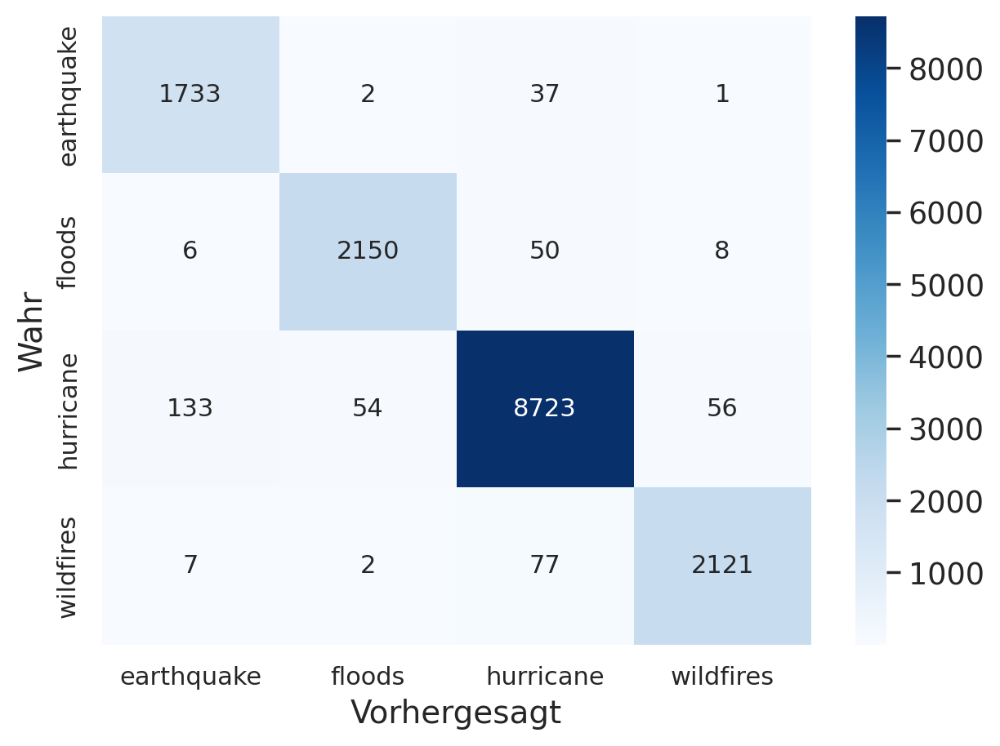

In [ ]:
show_disaster_tweet_prediction_distribution_general(lv1_labels_numerical, lv1_predictions_numerical, figsize_input_small, heatmap_fontsize_large, rotation_x_none, rotation_y_some, xylabels_fontsize_big, 'center', lv1_cm_class_names, mainlabels_fontsize, mainlabels_fontsize)

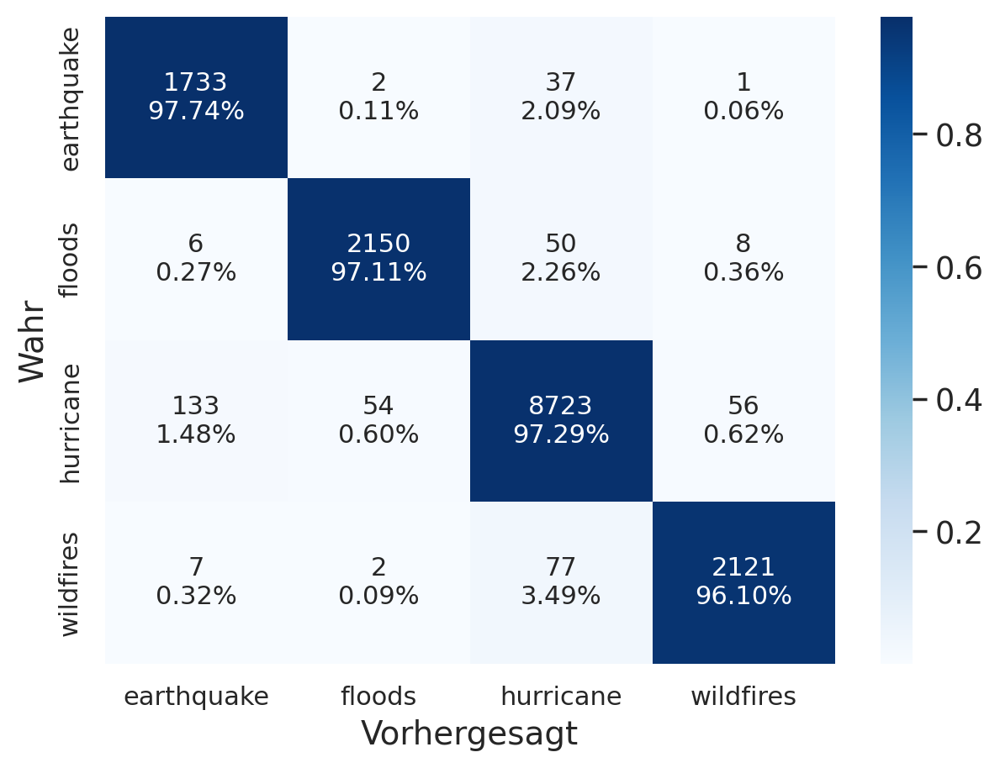

In [ ]:
show_disaster_tweet_prediction_distribution_detail(lv1_labels_numerical, lv1_predictions_numerical, figsize_input_small, labels_reshape_input_lv1, heatmap_fontsize_large, rotation_x_none, rotation_y_some, xylabels_fontsize_big, 'center', lv1_cm_class_names, mainlabels_fontsize, mainlabels_fontsize)

###LV2 nach LV1

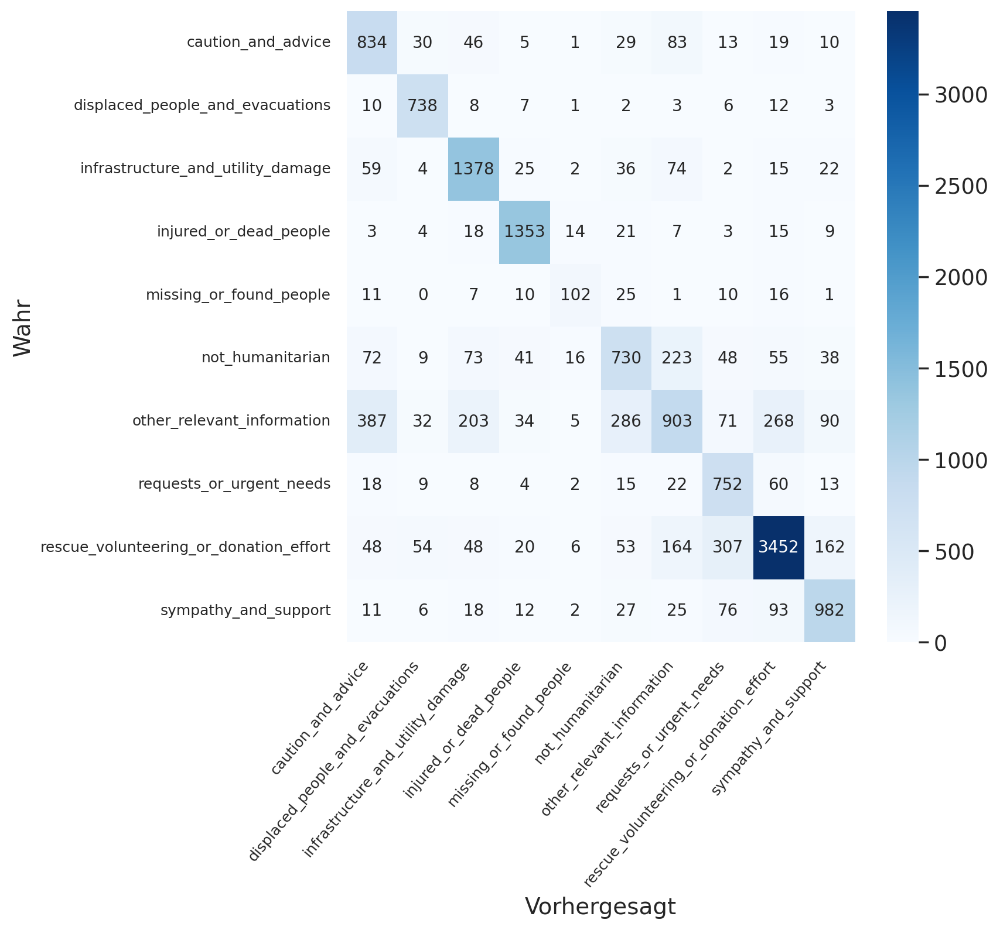

In [ ]:
show_disaster_tweet_prediction_distribution_general(merged_afterLV1_labels_numerical, merged_afterLV1_predictions_numerical, figsize_input_big, heatmap_fontsize_medium, rotation_x_some, rotation_y_none, xylabels_fontsize_small, 'right', lv2_after_lv1_cm_class_names, mainlabels_fontsize, mainlabels_fontsize)

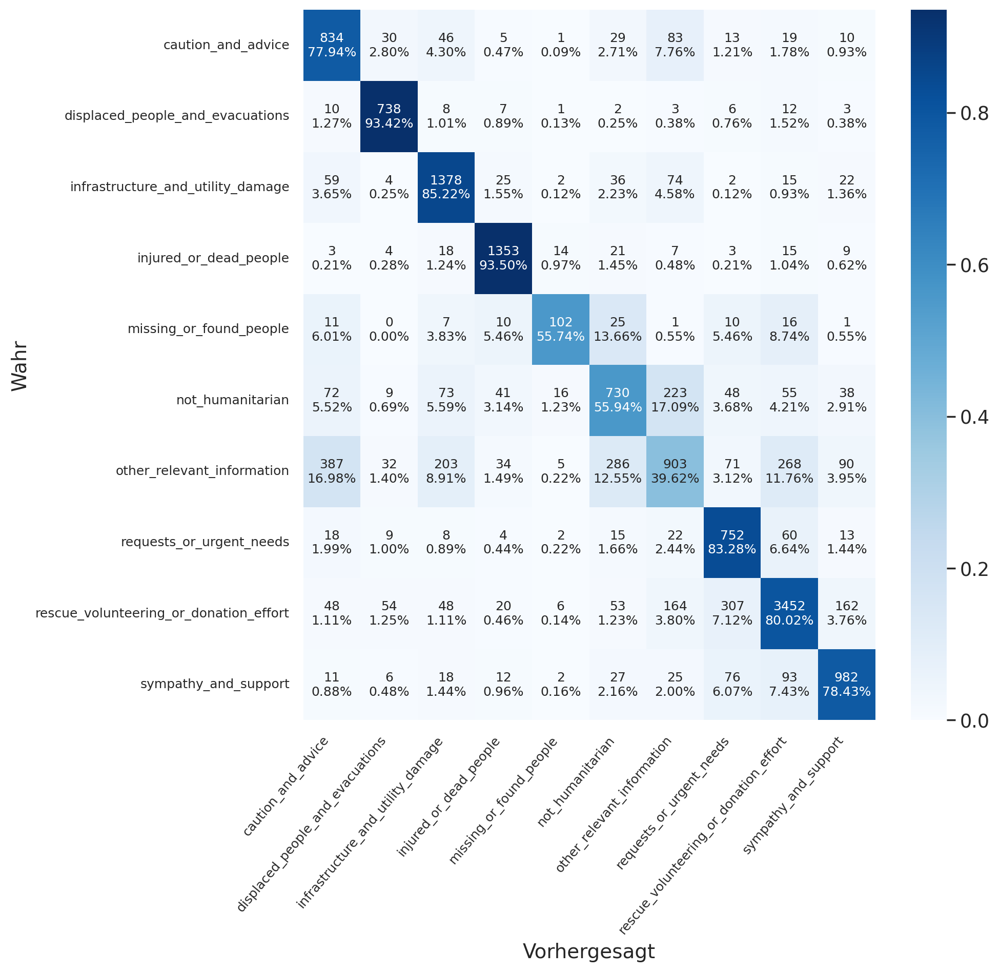

In [ ]:
show_disaster_tweet_prediction_distribution_detail(merged_afterLV1_labels_numerical, merged_afterLV1_predictions_numerical, figsize_input_verybig, labels_reshape_input_lv2, heatmap_fontsize_small, rotation_x_some, rotation_y_none, xylabels_fontsize_small, 'right', lv2_after_lv1_cm_class_names, mainlabels_fontsize, mainlabels_fontsize)

###LV2

In [ ]:
lv2_predictions = torch.load('/content/drive/MyDrive/TransformingDisasterTweets/Data/lv2_predictions.pt')
lv2_predictions_numerical = torch.argmax(lv2_predictions, dim=1)

lv2_labels = torch.load('/content/drive/MyDrive/TransformingDisasterTweets/Data/lv2_labels.pt')
lv2_labels_numerical = torch.argmax(lv2_labels, dim=1)

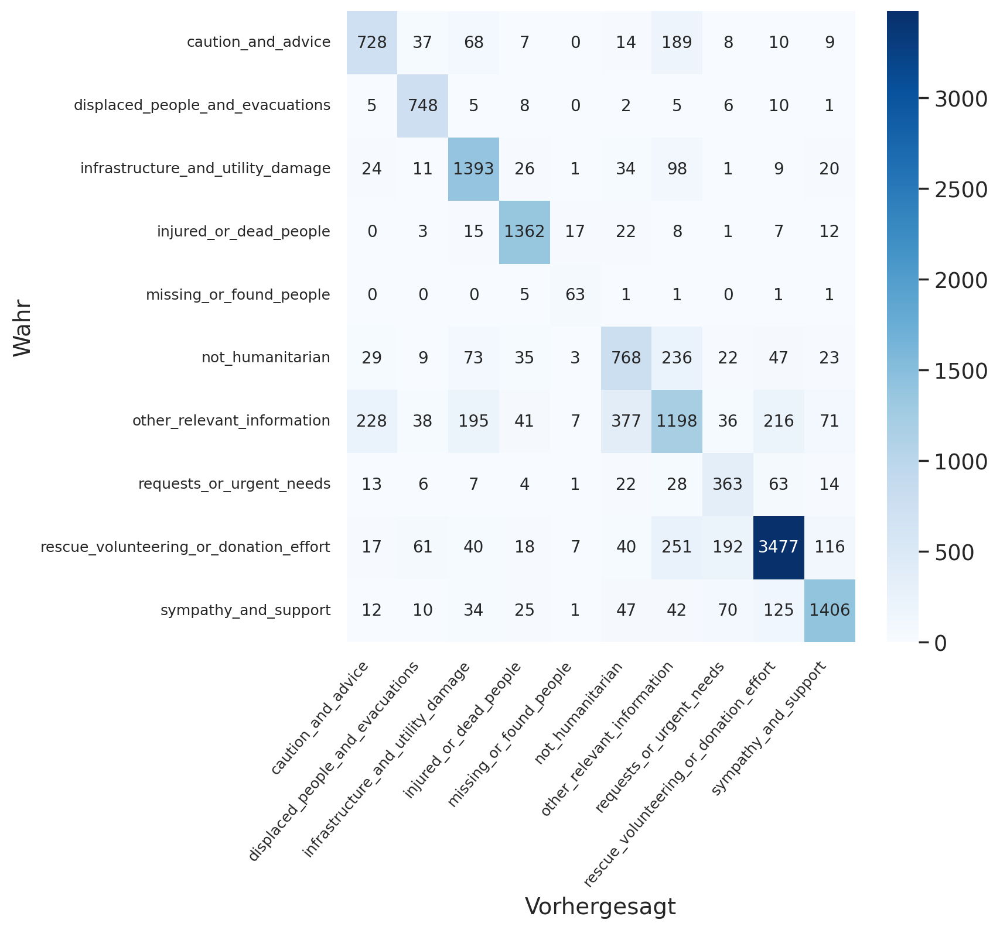

In [ ]:
show_disaster_tweet_prediction_distribution_general(lv2_labels_numerical, lv2_predictions_numerical, figsize_input_big, heatmap_fontsize_medium, rotation_x_some, rotation_y_none, xylabels_fontsize_small, 'right', lv2_after_lv1_cm_class_names, mainlabels_fontsize, mainlabels_fontsize)

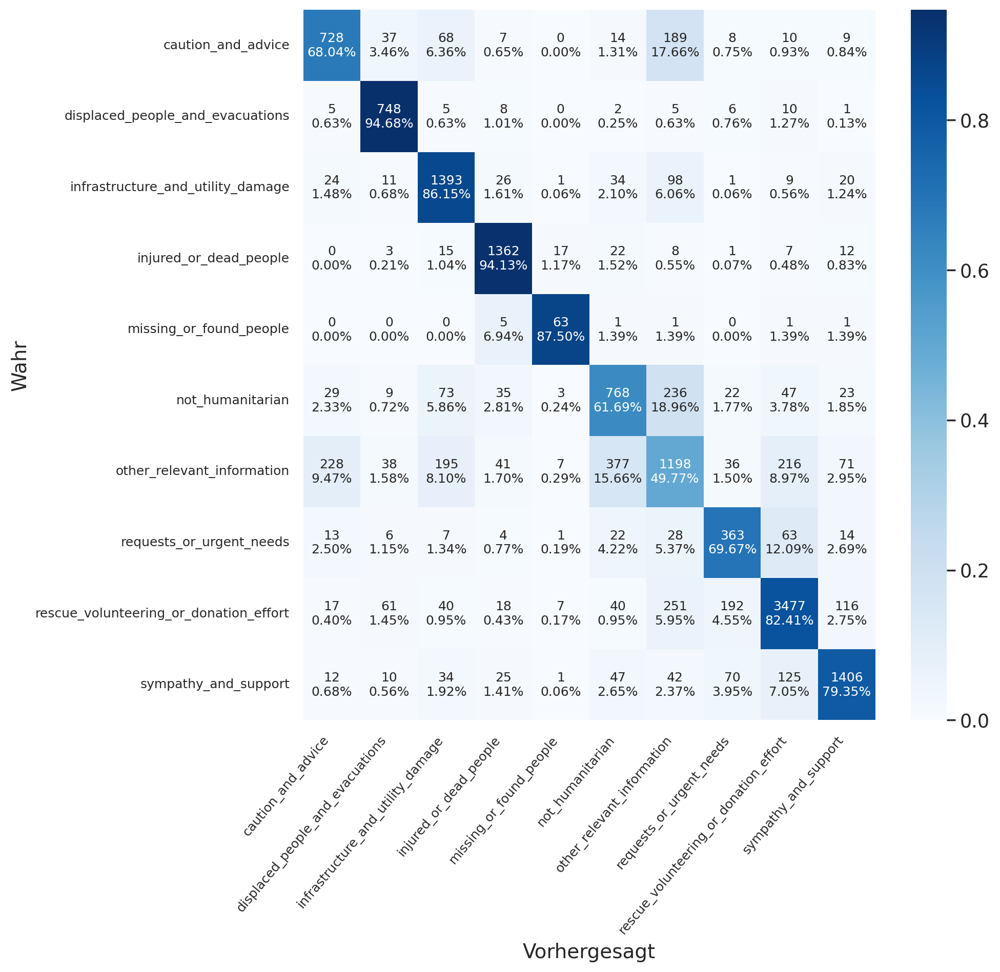

In [ ]:
show_disaster_tweet_prediction_distribution_detail(lv2_labels_numerical, lv2_predictions_numerical, figsize_input_verybig, labels_reshape_input_lv2, heatmap_fontsize_small, rotation_x_some, rotation_y_none, xylabels_fontsize_small, 'right', lv2_after_lv1_cm_class_names, mainlabels_fontsize, mainlabels_fontsize)

###EQU

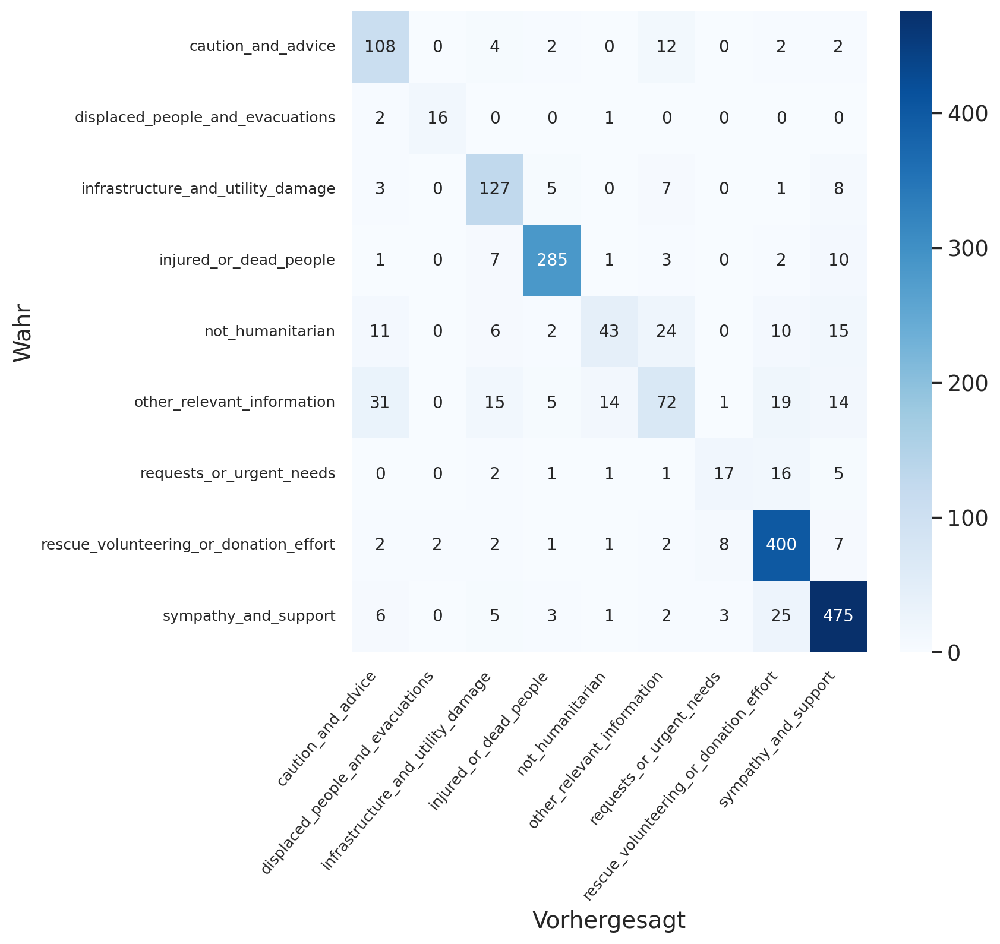

In [ ]:
show_disaster_tweet_prediction_distribution_general(equ_afterLV1_labels_numerical, equ_afterLV1_predictions_numerical, figsize_input_big, heatmap_fontsize_medium, rotation_x_some, rotation_y_none, xylabels_fontsize_small, 'right', equ_cm_class_names, mainlabels_fontsize, mainlabels_fontsize)

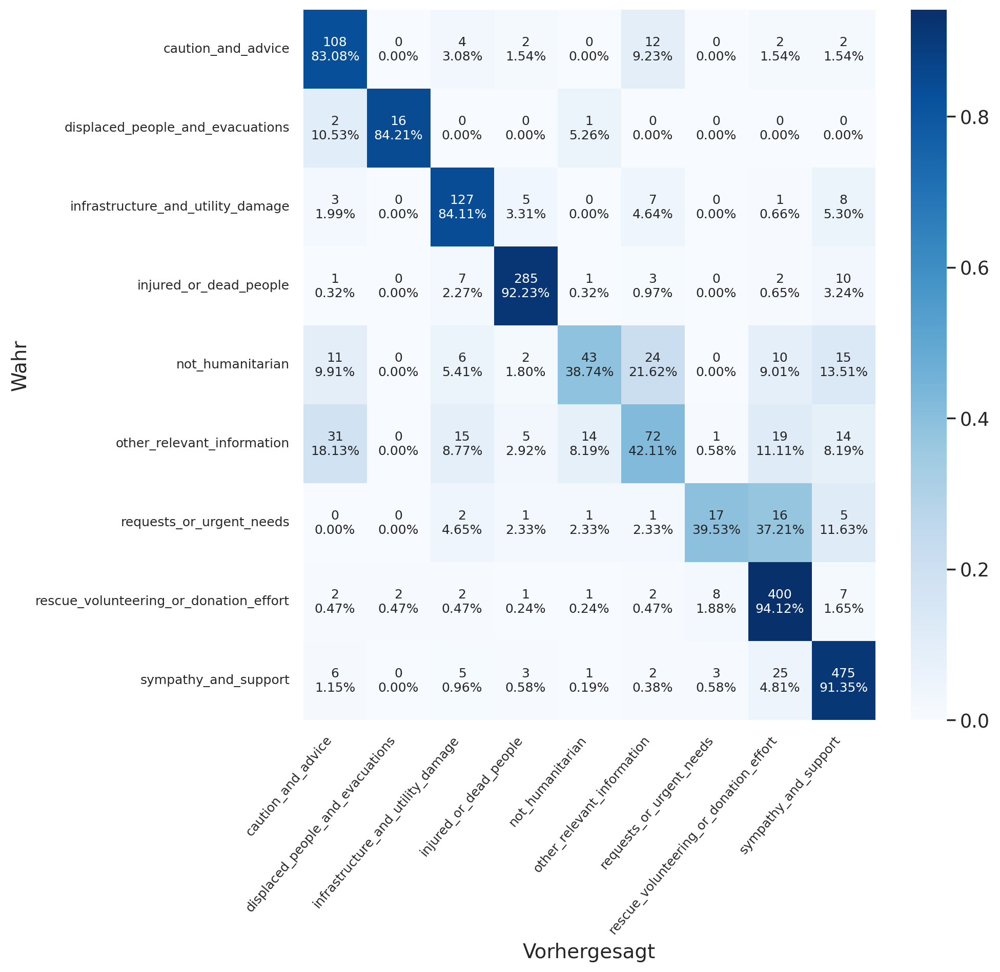

In [ ]:
show_disaster_tweet_prediction_distribution_detail(equ_afterLV1_labels_numerical, equ_afterLV1_predictions_numerical, figsize_input_verybig, labels_reshape_input_equ, heatmap_fontsize_small, rotation_x_some, rotation_y_none, xylabels_fontsize_small, 'right', equ_cm_class_names, mainlabels_fontsize, mainlabels_fontsize)

###FLD

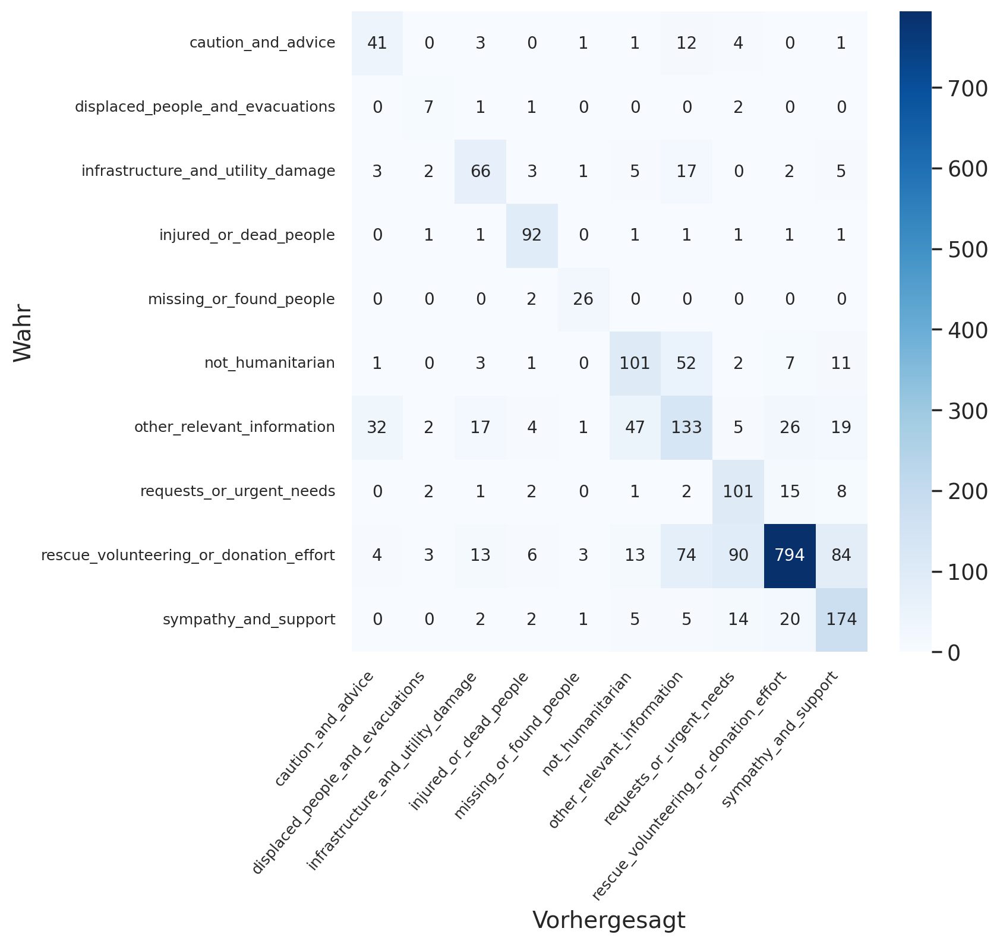

In [ ]:
show_disaster_tweet_prediction_distribution_general(fld_afterLV1_labels_numerical, fld_afterLV1_predictions_numerical, figsize_input_big, heatmap_fontsize_medium, rotation_x_some, rotation_y_none, xylabels_fontsize_small, 'right', lv2_after_lv1_cm_class_names, mainlabels_fontsize, mainlabels_fontsize)

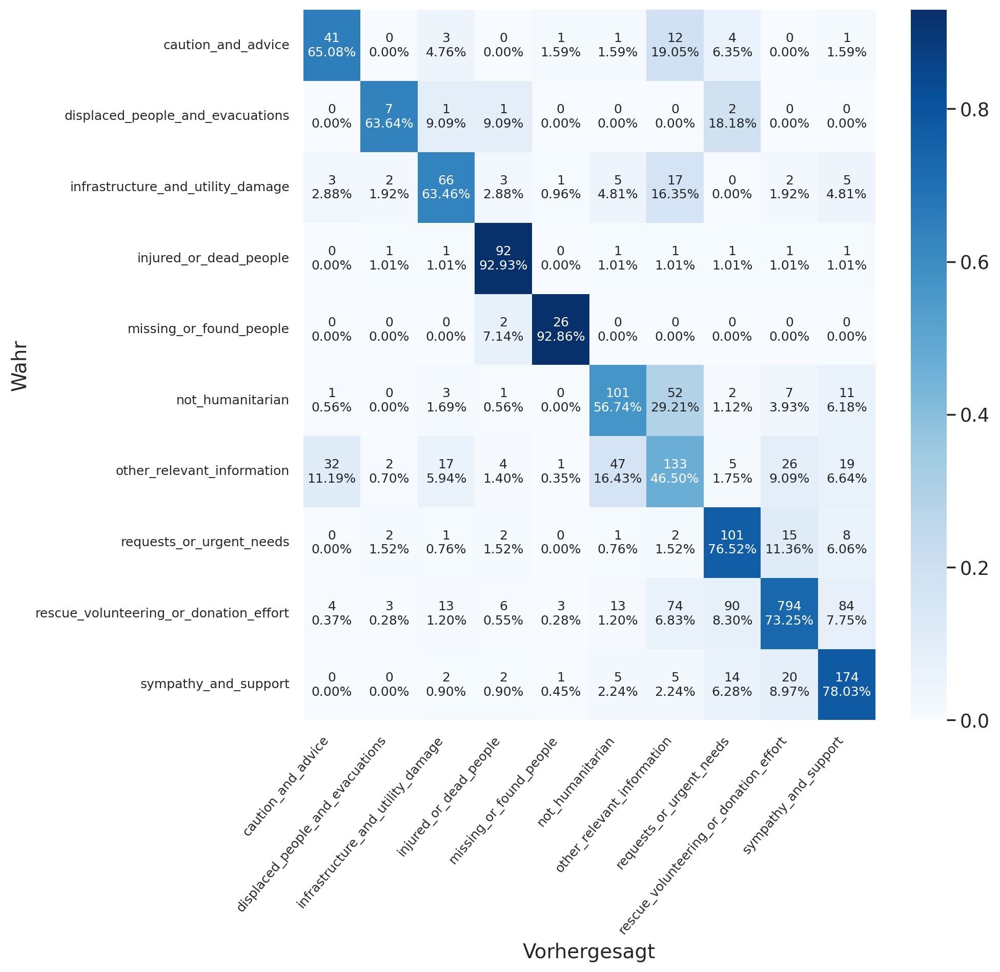

In [ ]:
show_disaster_tweet_prediction_distribution_detail(fld_afterLV1_labels_numerical, fld_afterLV1_predictions_numerical, figsize_input_verybig, labels_reshape_input_lv2, heatmap_fontsize_small, rotation_x_some, rotation_y_none, xylabels_fontsize_small, 'right', lv2_after_lv1_cm_class_names, mainlabels_fontsize, mainlabels_fontsize)

###HRC

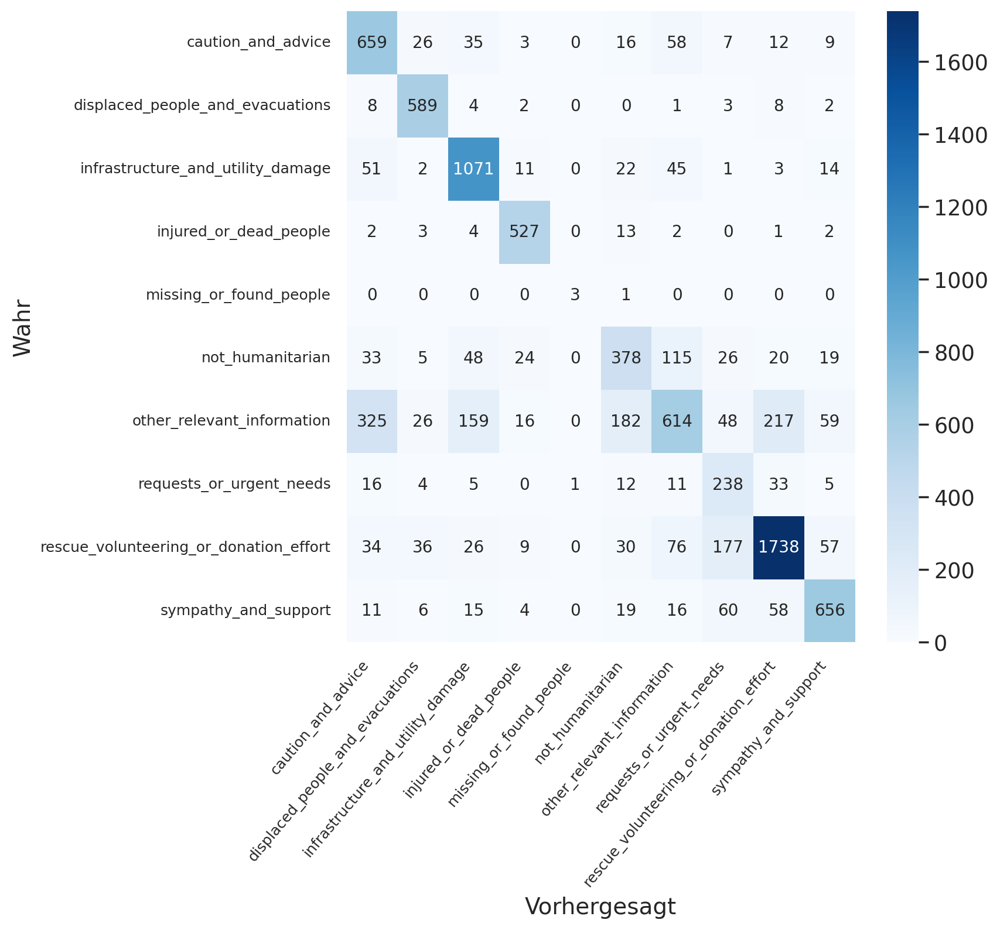

In [ ]:
show_disaster_tweet_prediction_distribution_general(hrc_afterLV1_labels_numerical, hrc_afterLV1_predictions_numerical, figsize_input_big, heatmap_fontsize_medium, rotation_x_some, rotation_y_none, xylabels_fontsize_small, 'right', lv2_after_lv1_cm_class_names, mainlabels_fontsize, mainlabels_fontsize)

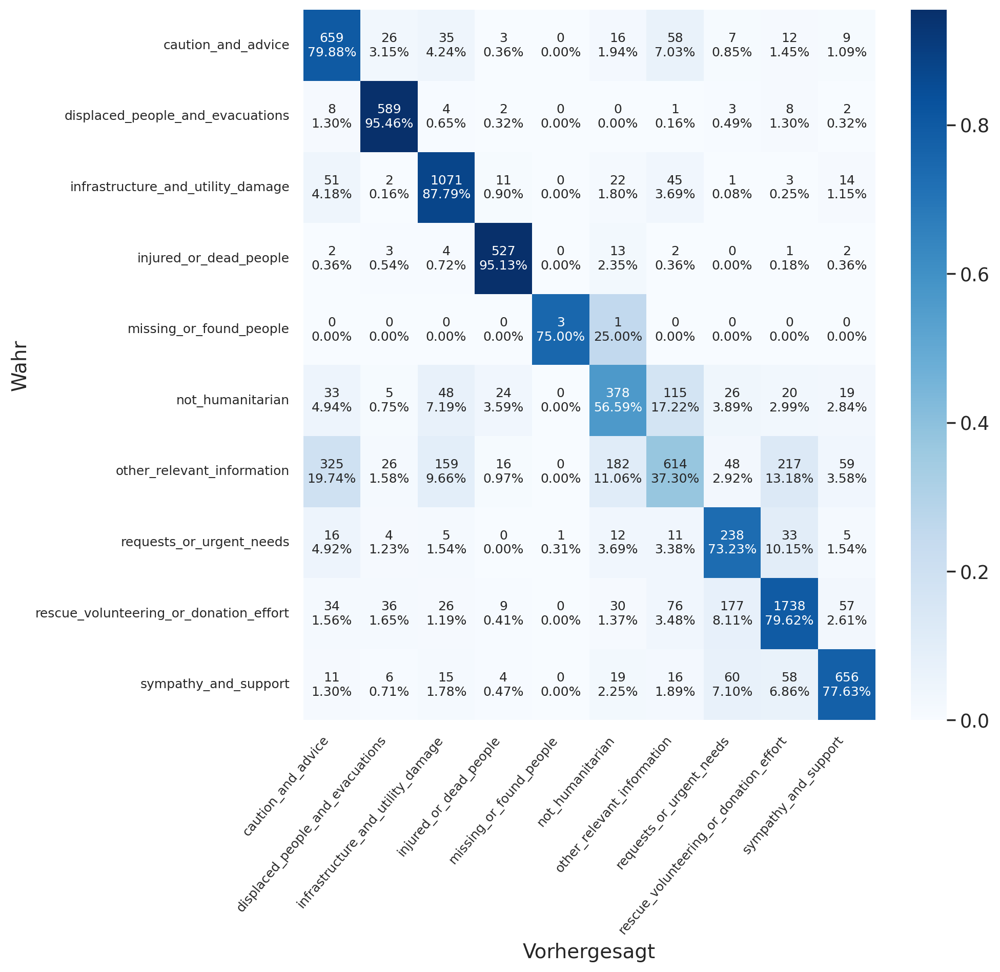

In [ ]:
show_disaster_tweet_prediction_distribution_detail(hrc_afterLV1_labels_numerical, hrc_afterLV1_predictions_numerical, figsize_input_verybig, labels_reshape_input_lv2, heatmap_fontsize_small, rotation_x_some, rotation_y_none, xylabels_fontsize_small, 'right', lv2_after_lv1_cm_class_names, mainlabels_fontsize, mainlabels_fontsize)

###WFR

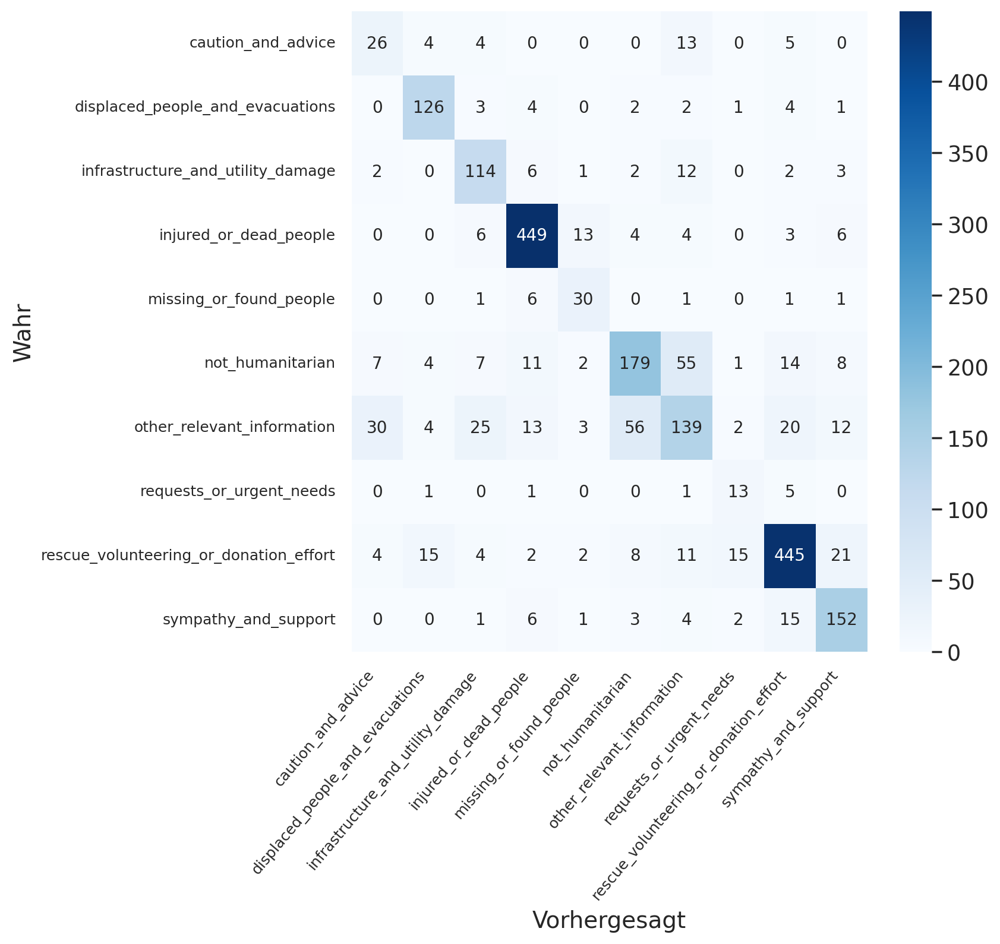

In [ ]:
show_disaster_tweet_prediction_distribution_general(wfr_afterLV1_labels_numerical, wfr_afterLV1_predictions_numerical, figsize_input_big, heatmap_fontsize_medium, rotation_x_some, rotation_y_none, xylabels_fontsize_small, 'right', lv2_after_lv1_cm_class_names, mainlabels_fontsize, mainlabels_fontsize)

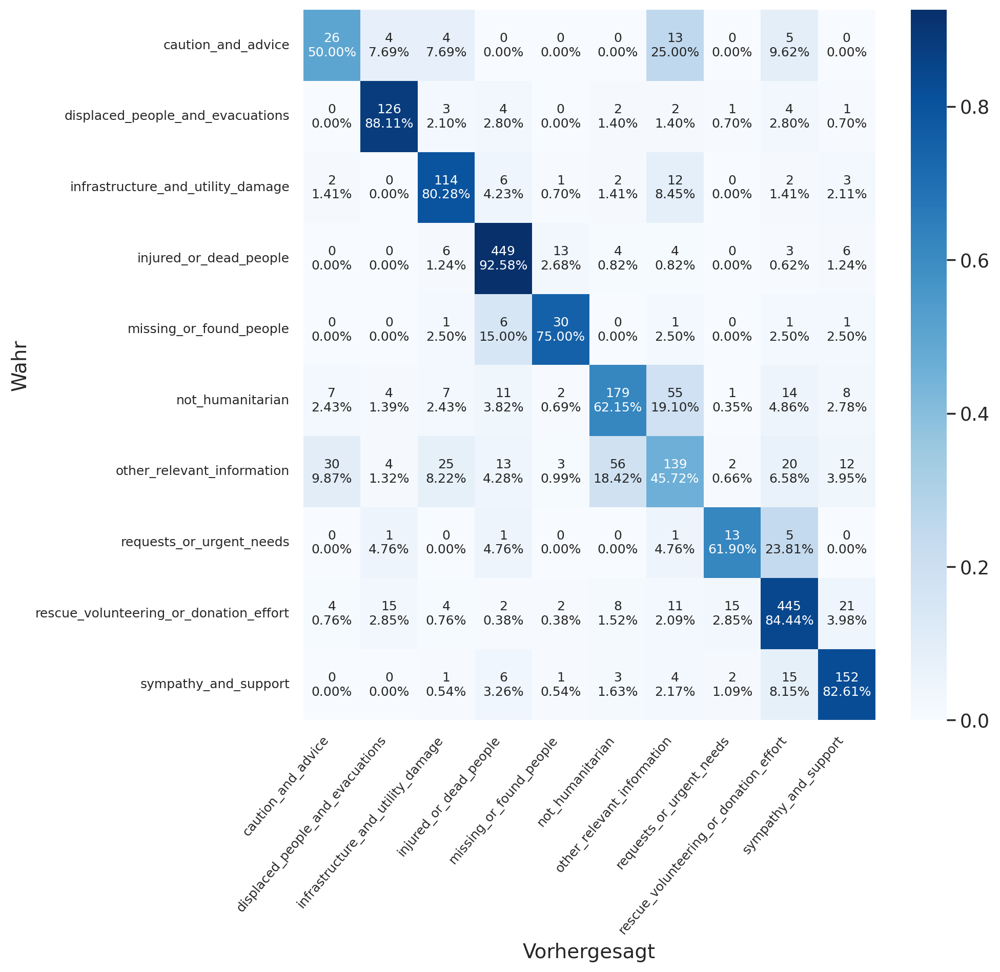

In [ ]:
show_disaster_tweet_prediction_distribution_detail(wfr_afterLV1_labels_numerical, wfr_afterLV1_predictions_numerical, figsize_input_verybig, labels_reshape_input_lv2, heatmap_fontsize_small, rotation_x_some, rotation_y_none, xylabels_fontsize_small, 'right', lv2_after_lv1_cm_class_names, mainlabels_fontsize, mainlabels_fontsize)

## Evaluation

### Accuracies

In [ ]:
# Info: General Accuracy Strategy1_specializedOnEventType
accuracy1 = MulticlassAccuracy(num_classes=10)
accuracy1(merged_afterLV1_predictions, merged_afterLV1_labels_numerical)

tensor(0.6606)

In [ ]:
# Info: General Accuracy Strategy2_onlyHumanitarianCategory
accuracy1_lv2 = MulticlassAccuracy(num_classes=10)
accuracy1_lv2(predictions_lv2, labels_lv2_numerical)

tensor(0.7734)

In [ ]:
# Info: Accuracies Strategy1_specializedOnEventType
accuracy2 = MulticlassAccuracy(num_classes=10, average=None)
accuracy2(merged_afterLV1_predictions, merged_afterLV1_labels_numerical)

tensor([0.7794, 0.9342, 0.8522, 0.9350, 0.3224, 0.5149, 0.3892, 0.3987, 0.6959,
        0.7843])

In [ ]:
# Info: Accuracies Strategy2_onlyHumanitarianCategory
accuracy2_lv2 = MulticlassAccuracy(num_classes=10, average=None)
accuracy2_lv2(predictions_lv2, labels_lv2_numerical)

tensor([0.6804, 0.9468, 0.8615, 0.9413, 0.8750, 0.6169, 0.4977, 0.6967, 0.8241,
        0.7935])

### Aurocs

In [ ]:
# Info: General Auroc Strategy1_specializedOnEventType
multi_auroc1 = MulticlassAUROC(num_classes=10, average="macro", thresholds=None)
multi_auroc1(merged_afterLV1_predictions, merged_afterLV1_labels_numerical)

tensor(0.8503)

In [ ]:
# Info: General Auroc Strategy2_onlyHumanitarianCategory
multi_auroc1_lv2 = MulticlassAUROC(num_classes=10, average="macro", thresholds=None)
multi_auroc1_lv2(predictions_lv2, labels_lv2_numerical)

tensor(0.9640)

In [ ]:
# Info: Aurocs Strategy1_specializedOnEventType
multi_auroc2 = MulticlassAUROC(num_classes=10, average=None, thresholds=None)
multi_auroc2(merged_afterLV1_predictions, merged_afterLV1_labels_numerical)

tensor([0.9570, 0.9913, 0.9716, 0.9925, 0.4238, 0.8782, 0.8533, 0.6381, 0.8696,
        0.9272])

In [ ]:
# Info: Aurocs Strategy2_onlyHumanitarianCategory
multi_auroc2_lv2 = MulticlassAUROC(num_classes=10, average=None, thresholds=None)
multi_auroc2_lv2(predictions_lv2, labels_lv2_numerical)

tensor([0.9643, 0.9932, 0.9818, 0.9959, 0.9863, 0.9415, 0.8761, 0.9551, 0.9722,
        0.9739])

### Precision/Recall/F1/Support

In [ ]:
# Info: Evaluierungs-Report Strategy1_specializedOnEventType
y_pred = merged_afterLV1_predictions.numpy()
y_true = merged_afterLV1_labels.numpy()

upper, lower = 1, 0
THRESHOLD = 0.5

y_pred = np.where(y_pred > THRESHOLD, upper, lower)

classification_report_lv1 = classification_report(
    y_true, 
    y_pred, 
    target_names=LABEL_COLUMNS_LV2, 
    zero_division=0)

print(classification_report_lv1)

                                        precision    recall  f1-score   support

                    caution_and_advice       0.61      0.76      0.68      1070
      displaced_people_and_evacuations       0.85      0.93      0.89       790
     infrastructure_and_utility_damage       0.79      0.83      0.81      1617
                injured_or_dead_people       0.91      0.92      0.92      1447
               missing_or_found_people       0.73      0.82      0.77        72
                      not_humanitarian       0.63      0.49      0.55      1245
            other_relevant_information       0.64      0.29      0.40      2407
              requests_or_urgent_needs       0.48      0.66      0.56       521
rescue_volunteering_or_donation_effort       0.87      0.77      0.82      4219
                  sympathy_and_support       0.82      0.80      0.81      1772

                             micro avg       0.78      0.70      0.73     15160
                             macro avg

In [ ]:
# Info: Evaluierungs-Report Strategy2_onlyHumanitarianCategory
y_pred_lv2 = predictions_lv2.numpy()
y_true_lv2 = labels_lv2.numpy()

upper, lower = 1, 0
THRESHOLD = 0.5

y_pred_lv2 = np.where(y_pred_lv2 > THRESHOLD, upper, lower)

print(classification_report(
  y_true_lv2, 
  y_pred_lv2, 
  target_names=LABEL_COLUMNS_LV2, 
  zero_division=0
))

                                        precision    recall  f1-score   support

                    caution_and_advice       0.72      0.64      0.68      1070
      displaced_people_and_evacuations       0.82      0.94      0.88       790
     infrastructure_and_utility_damage       0.77      0.86      0.81      1617
                injured_or_dead_people       0.91      0.93      0.92      1447
               missing_or_found_people       0.64      0.86      0.73        72
                      not_humanitarian       0.60      0.57      0.59      1245
            other_relevant_information       0.63      0.42      0.50      2407
              requests_or_urgent_needs       0.55      0.67      0.60       521
rescue_volunteering_or_donation_effort       0.89      0.79      0.84      4219
                  sympathy_and_support       0.88      0.77      0.82      1772

                             micro avg       0.79      0.72      0.76     15160
                             macro avg

## Testen mit eigenem Test-Kommentar

In [ ]:
'''
# Info: Testen mit Test-Kommentar

test_comment = "Of the 23 people killed by the fire in Paradise, California, 6 died in cars."

encoding = tokenizer.encode_plus(
  test_comment,
  add_special_tokens=True,
  max_length=512,
  return_token_type_ids=False,
  padding="max_length",
  return_attention_mask=True,
  return_tensors='pt',
)

_, test_prediction =trained_model_lv1(encoding["input_ids"], encoding["attention_mask"])
test_prediction = test_prediction.flatten().numpy()

for label, prediction in zip(LABEL_COLUMNS_LV1, test_prediction):
  print(f"{label}: {prediction}")
'''

earthquake: 0.025412052869796753
floods: 0.04435795173048973
hurricane: 0.21904456615447998
wildfires: 0.5544158220291138


In [ ]:
'''
# Info: Testen mit Test-Kommentar

THRESHOLD = 0.5

#test_comment = "I can't find my sister, has anyone seen her?"
#test_comment = "I want to spend all my money and donate to help these people"
test_comment = "My thoughts are with all the miserable people in the affected region"
encoding = tokenizer.encode_plus(
  test_comment,
  add_special_tokens=True,
  max_length=512,
  return_token_type_ids=False,
  padding="max_length",
  return_attention_mask=True,
  return_tensors='pt',
)

_, test_prediction = trained_model_lv1(encoding["input_ids"], encoding["attention_mask"])
test_prediction = test_prediction.flatten().numpy()

for label, prediction in zip(LABEL_COLUMNS_LV1, test_prediction):
  if prediction < THRESHOLD:
    continue
  print(f"{label}: {prediction}")
'''

sympathy_and_support: 0.9531278610229492
